# Introduction

This a notebook for the [2018 Data Science Bowl Kaggle contest](https://www.kaggle.com/competitions/data-science-bowl-2018/overview). Data are availble [here](https://www.kaggle.com/competitions/data-science-bowl-2018/data).

**Goal**

The goal for this Kaggle is to detect and extract the nuclei shown in the medical images, this is a `semantic segmentation` task

## Useful Packages

In [1]:
import os

import matplotlib
import matplotlib.pyplot as plt    # Python 2D plotting library
import matplotlib.cm as cm         # Color map
import numpy as np
import scipy
import warnings

import cv2
import lightgbm as lgb
import optuna
from optuna.integration import LightGBMPruningCallback
from optuna.visualization.matplotlib import plot_optimization_history, plot_param_importances
import pandas as pd
from PIL import Image
from PIL.ExifTags import TAGS
import scipy.ndimage as ndimage
import seaborn as sns
import skimage
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
import sklearn
import tensorflow as tf

#matplotlib.rcParams['figure.dpi'] = 100
#sns.set()
%matplotlib inline
warnings.simplefilter('ignore')


from keras.models import Model, load_model
from keras.layers import Input
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K
from keras import Input, layers
from keras.models import Sequential, Model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

from ultralytics import YOLO

/Users/theophileloiseau/miniconda3/envs/bowl_2018/lib/python3.10/site-packages/dask/dataframe/utils.py:374: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
/Users/theophileloiseau/miniconda3/envs/bowl_2018/lib/python3.10/site-packages/dask/dataframe/utils.py:374: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
/Users/theophileloiseau/miniconda3/envs/bowl_2018/lib/python3.10/site-packages/dask/dataframe/utils.py:374: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt6

## Utils

In [2]:
def get_images_masks_paths(path, test=False):
    
    """ Given a path, creates a dataframe containing all the imageIds with its corresponding path and 
    if test=True, creates a second dataframe with all the imageIds and the paths of their corresponding masks"""
    
    df_image = pd.DataFrame(columns=['imageId', 'image_path'])
    df_mask = pd.DataFrame(columns=['imageId', 'mask_path'])
    l_image = []
    l_mask = []
    for filename in os.listdir(path):
        f = os.path.join(path, filename)
        # checking if it is a file
        if os.path.isdir(f):
            for filename2 in os.listdir(f):
                f2 = os.path.join(f, filename2)
                if f2.endswith("images"):
                    l_image = []
                    l_image.append(filename)
                    l_image.append(f2 + '/' + os.listdir(f2)[0])
                    df_image.loc[len(df_image)] = l_image
                elif f2.endswith("masks"):
                    for i in os.listdir(f2):
                        l_mask = []
                        l_mask.append(filename)
                        l_mask.append(f2 + '/' + i)
                        df_mask.loc[len(df_mask)] = l_mask
    if not test:
        return df_image, df_mask
    else: 
        return df_image
    
def compute_height_width_ratio_channels(df):
    
    """For a given dataframe, computes the height, width, ratio, 
    mode, format & number of channels of each image using Pillow"""
    
    image = Image.open(df['image_path'])
    df['height'] = image.height
    df['width'] = image.width
    # df['num_channels'] = len(image.getbands()) # Commented as it complexifies the num_channels
    df['num_channels'] = cv2.imread(df['image_path']).shape[2]
    df['image_format'] = image.format
    df['image_mode'] = image.mode
    df['ratio'] = df['height']/df['width']
    return df

def compute_height_width_ratio_channels_ocv(df):
    
    """For a given dataframe, computes the height, width, ratio 
    & number of channels of each image using OpenCV"""
    
    # we do not add flags=cv2.IMREAD_UNCHANGED as the alpha channel has the same value for all images 
    df['height'] = cv2.imread(df['image_path']).shape[0]
    df['width'] = cv2.imread(df['image_path']).shape[1]
    df['num_channels'] = cv2.imread(df['image_path']).shape[2]
    df['ratio'] = df['height']/df['width']
    return df

def read_mask(df_mask, imageId, gray=True, size=None):
    for idx, i in enumerate(np.array(df_mask[df_mask['imageId']==imageId]['mask_path'])):
        if gray: mask_tmp = cv2.imread(i, cv2.IMREAD_GRAYSCALE)
        else: mask_tmp = cv2.imread(i)
        if size:
            mask_tmp = cv2.resize(mask_tmp, size, interpolation = cv2.INTER_AREA)
        if not idx: mask = mask_tmp.copy()
        else: mask = np.maximum(mask, mask_tmp)
    return mask 


def read_distinguished_mask(df_mask, imageId, gray=True, size=None):
    for idx, i in enumerate(np.array(df_mask_train[df_mask_train['imageId']==im_id]['mask_path'])):
        if gray: mask_tmp = cv2.imread(i, cv2.IMREAD_GRAYSCALE)
        else: mask_tmp = cv2.imread(i)
        if size:
            mask_tmp = cv2.resize(mask_tmp, size, interpolation = cv2.INTER_AREA)
        if not idx: 
            mask = []
            mask.append(mask_tmp)
        else: mask.append(mask_tmp)
    return np.array(mask)

def get_image_data(df_image, size, gray=False):
    x = []
    for i in df_image['image_path']:
        if gray: im = cv2.imread(i, cv2.IMREAD_GRAYSCALE)
        else: im = cv2.imread(i)
        im = cv2.resize(im, size, interpolation = cv2.INTER_AREA)
        if gray: x.append(np.expand_dims(im, axis=2))
        else: x.append(im)
    return np.array(x)

def get_masks_data(df_image, df_mask, size, gray=True):
    y_train = []
    for i in df_image['imageId']:
        y_train.append(np.expand_dims(read_mask(df_mask,i, gray=gray, size=size), axis=2))
    return np.array(y_train)

def normalize_x(x, method=1):
    if method==1:
        return(x/255.)
    elif method==2:
        return (cv2.normalize(x, None, 0, 1.0, cv2.NORM_MINMAX).astype(np.float32))
    elif method==3:
        # Standardisation with image statistics
        mean = x.mean(axis=tuple(np.arange(1,len(x.shape))), keepdims=True) 
        std = x.std(axis=tuple(np.arange(1,len(x.shape))), keepdims=True) 
        return (x-mean)/std
    elif method==4:
        # Standardisation with training set statistics
        mean = x.mean(axis=tuple(np.arange(0,len(x.shape)-1)), keepdims=True)
        std = x.std(axis=tuple(np.arange(0,len(x.shape)-1)), keepdims=True)
        x = (x-mean)/std
        return x, mean, std
    
def inverse_background(x):
    
    """Inverse background when the background is light (i.e. mean grayscale value above 128)"""
    
    return np.array(list(map(lambda i: 255.-i if normalize_x(i).mean()>0.5 else i, x)))


def sharpen_frontier(x, threshold=128):
    
    """Create sharpen frontier for masks"""
    
    return np.array(list(map(lambda i: (i>threshold).astype(int)*255.,x)))


"""
def preprocess_data(df_image_train, df_mask_train, df_image_test, df_image_test_stage2, 
                    size=(128,128), method=1, inverse=True, grayscale=True, sharp=True, threshold=128):
    
    x_train = get_image_data(df_image_train, size, gray=grayscale)
    x_test = get_image_data(df_image_test, size, gray=grayscale)
    x_test_stage2 = get_image_data(df_image_test_stage2, size, gray=grayscale)
    y_train = get_masks_data(df_image_train, df_mask_train, size=size)
    if inverse:
        x_train = inverse_background(x_train)
        x_test = inverse_background(x_test)
        x_test_stage2 = inverse_background(x_test_stage2)
    if sharp:
        y_train = sharpen_frontier(y_train, threshold=threshold)
    if method!=4:
        x_train = normalize_x(x_train, method=method)
        x_test = normalize_x(x_test, method=method)
        x_test_stage2 = normalize_x(x_test_stage2, method=method)
        y_train = normalize_x(y_train_sharp, method=method)
    else:
        x_train, mean, std = normalize_x(x_train, method=method)
        x_test = (x_test - mean)/std
        x_test_stage2 = (x_test_stage2 - mean)/std
        y_train,_,_ = normalize_x(y_train, method=method)
    
    return x_train, x_test ,x_test_stage2, y_train 
"""


def preprocess_data(df_image_train, df_mask_train, df_image_test, df_image_test_stage2, df_mask_test=None,
                    size=(128,128), method=1, inverse=True, grayscale=True, sharp=True, threshold=128, agg=False):
    
    if df_mask_test is not None: 
        df_image_train_agg = pd.concat([df_image_train.drop('num_masks',axis=1),df_image_test])
        x_train = get_image_data(df_image_train_agg, size, gray=grayscale)
        x_test = get_image_data(df_image_test, size, gray=grayscale)
        x_test_stage2 = get_image_data(df_image_test_stage2, size, gray=grayscale)
        y_train = get_masks_data(df_image_train, df_mask_train, size=size)
    else:
        x_train = get_image_data(df_image_train, size, gray=grayscale)
        x_test = get_image_data(df_image_test, size, gray=grayscale)
        x_test_stage2 = get_image_data(df_image_test_stage2, size, gray=grayscale)
        y_train = get_masks_data(df_image_train, df_mask_train, size=size)

    if inverse:
        x_train = inverse_background(x_train)
        x_test = inverse_background(x_test)
        x_test_stage2 = inverse_background(x_test_stage2)
    if sharp:
        y_train = sharpen_frontier(y_train, threshold=threshold)
        print(y_train.shape)
    if method!=4:
        x_train = normalize_x(x_train, method=method)
        x_test = normalize_x(x_test, method=method)
        x_test_stage2 = normalize_x(x_test_stage2, method=method)
        #y_train = normalize_x(y_train_sharp, method=method)
        y_train = y_train/255.
        print(y_train.shape)
    else:
        x_train, mean, std = normalize_x(x_train, method=method)
        x_test = (x_test - mean)/std
        x_test_stage2 = (x_test_stage2 - mean)/std
        #y_train,_,_ = normalize_x(y_train, method=method)
        y_train = y_train/255.
    if df_mask_test is not None: 
        y_mask = np.expand_dims(np.array([i for i in df_mask_resized['mask']]),axis=3)
        y_mask = sharpen_frontier(y_mask, threshold=0.5)/255.
        y_train = np.concatenate((y_train,y_mask))
    
    return x_train, x_test ,x_test_stage2, y_train


def generate_data_submission(l):
    """ From an image data of shape (height, weight) provide a run-length """
    c=1
    idx=0
    res=[]
    for i in range(0, len(l)-1):
        if l[i]+1 == l[i+1]:
            c+=1
        else:
            res.append(l[idx]+1)
            res.append(c)
            idx+=c
            c=1
    res.append(l[idx]+1)
    res.append(c)
    return res



"""#for i in range(0, len(l)):
i = 0
c = 1
v = l[0]
res = []
while i<len(l)-1:
    while (l[i+1]==l[i]+1):
        c+=1
        i+=1
        if i<len(l)-1:
            continue
        else: 
            break
    res.append(v)
    res.append(c)
    i+=1
    if i<len(l)-1:
        c = 1
        v = l[i]
    else:
        break"""


def resize_correctly_one_image(init_image, width, height):
    return cv2.resize(init_image,(width, height))               


def resize_images(images, df_images):
    """
    Resize image arrays in the correct shape
    -------------
    inputs:
    - images: numpy Array, array of images arrays
    - df_images: pandas DataFrame, DataFrame containing the original shape of the images
    
    outputs:
    - numpy Array, array of images arrays with their original shape
    """
    preds_test_resized = []
    for i in range(0, len(images)):
        preds_test_resized.append(resize_correctly_one_image(images[i],df_images.iloc[i]['width'], df_images.iloc[i]['height']))
    return np.array(preds_test_resized)

def format_result_one_image(y,imageId, height=128, width=128):

    """ Format output results in the form of a DataFrame and run_length encoding
    inputs: 
        y: array of mask, shape (height, width, 1)
        imageId: string of the imageId
    """
    
    res_list = []
    y_train_lab = y.reshape(y.shape[0],y.shape[1])
    lab_mask, num = skimage.morphology.label(y_train_lab == np.max(y_train_lab),return_num=True)
    df = pd.DataFrame([imageId]*num,columns=['imageId'])
    for i in range(1, num+1):
        l = np.where(lab_mask.transpose().reshape(height*width) == i)[0]
        res = generate_data_submission(l)
        res_list.append(res)
    rank = np.argsort([val[0] for val in res_list])
    df['EncodedPixels'] = np.array([" ".join([str(s) for s in l]) for l in res_list])[rank]
    return df


def format_output_data_all(df_x, y):
    df_final = pd.DataFrame(columns=['imageId','EncodedPixels'])
    for i in range(0, len(df_x)):
        df_final = pd.concat([df_final,format_result_one_image(y[i],df_x['imageId'].iloc[i], 
                                                               df_x['height'].iloc[i], df_x['width'].iloc[i])])
    return df_final


def resize_correctly_one_image(init_image, width, height):
    return cv2.resize(init_image,(width, height))               


def resize_images(images, df_images):
    """
    Resize image arrays in the correct shape
    -------------
    inputs:
    - images: numpy Array, array of images arrays
    - df_images: pandas DataFrame, DataFrame containing the original shape of the images
    
    outputs:
    - numpy Array, array of images arrays with their original shape
    """
    preds_test_resized = []
    for i in range(0, len(images)):
        preds_test_resized.append(resize_correctly_one_image(images[i],df_images.iloc[i]['width'], df_images.iloc[i]['height']))
    return np.array(preds_test_resized)


def read_encoded_image(encoding, height, width):
    """
    Transform a run-length encoded image into an array with correct wisth and height
    ---------------
    inputs:
    - encoding: list(str), one run-length encoded image
    - height: int, image height 
    - width: int, image width
    
    outputs:
    - numpy Array, image array
    """
    list_int = [int(code) for code in encoding.split()]
    image_test = np.zeros(height*width)
    for i in range(0,len(list_int),2):
        image_test[list_int[i]:list_int[i]+list_int[i+1]] = 1.
    return np.transpose(np.reshape(image_test, (width, height)))
 

def get_agg_mask_from_encoded(df_encoded, imageid, size=None):
    """
    Aggregates all the run-length encoded masks of an image and converts it into an array
    -------------
    inputs:
    - df_encoded: pandas DataFrame, dataframe containing the image ids 
    with their associated run-length encoded masks
    - imageid: str, the id of the image we want to convert its run-length encoded masks
    
    output:
    - mask: numpy Array, array with the aggregated masks of the image id
    """
    height = df_encoded[df_encoded['ImageId']==imageid]['Height'].iloc[0]
    width = df_encoded[df_encoded['ImageId']==imageid]['Width'].iloc[0]
    mask = np.zeros((height,width))
    for i in df_encoded[df_encoded['ImageId']==imageid]['EncodedPixels']:
        mask = np.maximum(mask, read_encoded_image(i,height,width))    
    if size:
        mask = cv2.resize(mask, size, interpolation = cv2.INTER_AREA)
    return mask


def remove_too_small_cells_one_image(image, threshold=0.03):
    lab_mask, num = skimage.morphology.label(image == np.max(image),return_num=True)
    for i in range(1, num+1):
        if (lab_mask==i).sum().sum()<max(int(threshold/100*lab_mask.shape[0]*lab_mask.shape[1]),1):
            lab_mask = np.where(lab_mask==i,0,lab_mask)
    lab_mask = np.where(lab_mask>0,1,lab_mask)
    return lab_mask


def remove_too_small_cells(images, threshold=0.004):
    images_retreated = []
    for i in range(0, len(images)):
        images_retreated.append(remove_too_small_cells_one_image(images[i], threshold))
    return np.array(images_retreated)

def watershed_transform(mask, kernel_size=(3,3), opening_iteration=2, 
                        dilating_iteration=2, threshold=0.4):
    """
    inputs: array image having values 0 and 1
    outputs: marker => array with labelled nucleus
    """
    img = np.uint8(mask*255).copy()
    img_rgb = cv.cvtColor(img, cv.COLOR_GRAY2BGR)
    
    # noise removal
    kernel = np.ones(kernel_size,np.uint8)
    opening = cv.morphologyEx(img,cv.MORPH_OPEN,kernel, iterations = opening_iteration)
    # sure background area
    sure_bg = cv.dilate(opening,kernel,iterations=dilating_iteration)
    # Finding sure foreground area
    dist_transform = cv.distanceTransform(opening,cv.DIST_L2,5)
    ret, sure_fg = cv.threshold(dist_transform,threshold*dist_transform.max(),255,0)
    # Finding unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = cv.subtract(sure_bg,sure_fg)
    
    # Marker labelling
    ret, markers = cv.connectedComponents(sure_fg)
    # Add one to all labels so that sure background is not 0, but 1
    markers = markers+1
    # Now, mark the region of unknown with zero
    markers[unknown==255] = 0
    
    markers = cv.watershed(img_rgb,markers)
    markers[markers==-1]=0
    markers[markers>0]-=1
    
    return markers


def watershed_transform_all(images, kernel_size=(3,3), opening_iteration=2, 
                        dilating_iteration=2, threshold=0.4):

    preds_test_watershed = []
    for i in range(0, len(images)):
        preds_test_watershed.append(watershed_transform(images[i],kernel_size=kernel_size,
                                                       opening_iteration=opening_iteration,
                                                       dilating_iteration=dilating_iteration,
                                                       threshold=threshold))
    return np.array(preds_test_watershed)


def format_result_one_mask(mask, imageId, height=128, width=128):

    """ Format output results in the form of a DataFrame and run_length encoding
    inputs: 
        mask: array of mask with segmented nucleus, shape (height, width, 1)
        imageId: string of the imageId
    """
    
    res_list = []
    y_train_lab = mask.reshape(mask.shape[0],mask.shape[1])
    list_lab = list(np.unique(mask))
    list_lab.remove(0)
    df = pd.DataFrame([imageId]*len(list_lab),columns=['imageId'])
    for i in list_lab:
        l = np.where(mask.transpose().reshape(mask.shape[0]*mask.shape[1]) == i)[0]
        res = generate_data_submission(l)
        res_list.append(res)
    rank = np.argsort([val[0] for val in res_list])
    df['EncodedPixels'] = np.array([" ".join([str(s) for s in l]) for l in res_list])[rank]
    return df


def format_output_data_all_masks(df_x, mask):
    df_final = pd.DataFrame(columns=['imageId','EncodedPixels'])
    for i in range(0, len(df_x)):
        df_final = pd.concat([df_final,format_result_one_mask(mask[i],df_x['imageId'].iloc[i], 
                                                               df_x['height'].iloc[i], df_x['width'].iloc[i])])
    return df_final


def split_train_val_set(img_df, val_split=0.10):
    np.random.seed(42)
    imageIDs = np.sort(img_df['imageId'].values)
    val_set_count = int(len(img_df.index)*val_split)

    val_set_imageIDs = np.random.choice(imageIDs, val_set_count, replace=False)
    train_set_imageIDs = list(set(imageIDs) - set(val_set_imageIDs))
    
    val_set_imageIDs.sort()
    train_set_imageIDs.sort()

    return train_set_imageIDs, val_set_imageIDs

## Presentation

We have several **folders** linked to this Kaggle:
- `stage1_train`: training set images. For each images, we have two subfolders:
    - `images`: which contains the image file
    - `masks`: providing the mask corresponding to each nucleus. One mask corresponds to one nucleus.
- `stage1_test`: stage 1 test set images. There is only the images (hence no mask).
- `stage2_test_final`: stage 2 test set images. There is only the images (hence no mask).

Also, we have **files** linked to this Kaggle:
- `stage1_train_labels.csv`: a file showing the run-length encoded representation of the training images. This is provided as a convenience and is redundant with the mask image files.
- `stage1_sample_submission.csv`: a submission file containing the ImageIds for which you must predict during stage 1
- `stage1_solution.csv`: a csv file containing all the masks corresponding to nuclei for each image in `stage1_test`
- `stage2_sample_submission_final.csv`: a submission file containing the ImageIds for which you must predict during stage 2

# Exploration

## Data Loading

In [3]:
# Transform csv files into dataframes
stage1_train_label = pd.read_csv('stage1_train_labels.csv')
submission_sample_stage1 = pd.read_csv('stage1_sample_submission.csv')
stage1_solution = pd.read_csv('stage1_solution.csv')
submission_sample_stage_2 = pd.read_csv('stage2_sample_submission_final.csv')

In [4]:
# collect all the train and test datasets 
df_image_train_raw, df_mask_train = get_images_masks_paths('stage1_train')
df_image_test_raw = get_images_masks_paths('stage1_test', test=True)
df_image_test_stage2_raw = get_images_masks_paths('stage2_test_final', test=True)

In [5]:
# Compute some features corresponding to images' caracteristics

# Train set
# get height, width, ratio & # of channels 
df_image_train = df_image_train_raw.apply(compute_height_width_ratio_channels, axis=1)

# get # of masks
df_image_train = df_image_train.merge(df_mask_train.groupby('imageId').agg('size').to_frame('num_masks'), 
                          left_on='imageId', 
                          right_index=True)

# Stage 1 test set
# get height, width, ratio & # of channels 
df_image_test = df_image_test_raw.apply(compute_height_width_ratio_channels, axis=1)

# Stage 2 test set
# get height, width, ratio & # of channels 
df_image_test_stage2 = df_image_test_stage2_raw.apply(compute_height_width_ratio_channels, axis=1)


libpng warning: PLTE: ignored in grayscale PNG


In [8]:
df_image_train

,imageId,image_path,height,width,num_channels,image_format,image_mode,ratio,num_masks
0,5cc036b65f7f2d5480e2be111a561f3713ac021683a9a9...,stage1_train/5cc036b65f7f2d5480e2be111a561f371...,256,256,3,PNG,RGBA,1.0,16
1,68f833de9f8c631cedd7031b8ed9b908c42cbbc1e14254...,stage1_train/68f833de9f8c631cedd7031b8ed9b908c...,256,256,3,PNG,RGBA,1.0,32
2,6c67b78e8164801059375ed9a607f61e67a7ae347e92e3...,stage1_train/6c67b78e8164801059375ed9a607f61e6...,256,320,3,PNG,RGBA,0.8,111
3,e1bcb583985325d0ef5f3ef52957d0371c96d4af767b13...,stage1_train/e1bcb583985325d0ef5f3ef52957d0371...,256,256,3,PNG,RGBA,1.0,6
4,a4c44fc5f5bf213e2be6091ccaed49d8bf039d78f6fbd9...,stage1_train/a4c44fc5f5bf213e2be6091ccaed49d8b...,256,320,3,PNG,RGBA,0.8,37
...,...,...,...,...,...,...,...,...,...
665,2817299fd3b88670e86a9db5651ba24333c299d1d41e54...,stage1_train/2817299fd3b88670e86a9db5651ba2433...,256,256,3,PNG,RGBA,1.0,16
666,e216ec5063d3562b793e434c491051bd8867f6c2e571e4...,stage1_train/e216ec5063d3562b793e434c491051bd8...,256,256,3,PNG,RGBA,1.0,21
667,a08166d91d2cca263d2dd52764dc25c9c582b7a5ece2b8...,stage1_train/a08166d91d2cca263d2dd52764dc25c9c...,256,320,3,PNG,RGBA,0.8,22
668,bff985591dd5d6303018a6e9a3dcfb336771a414ad4605...,stage1_train/bff985591dd5d6303018a6e9a3dcfb336...,256,256,3,PNG,RGBA,1.0,17


In [9]:
#df_image_mask_train = df_image.merge(df_mask, on='imageId')
#df_image_mask_train

## Global Analysis

### Global Analysis on Train Set

In [54]:
df_image_train.describe()

,height,width,num_channels,ratio,num_masks
count,670.000000,670.000000,670.0,670.000000,670.000000
mean,333.991045,378.500000,3.0,0.921008,43.971642
std,149.474845,204.838693,0.0,0.114294,47.962530
min,256.000000,256.000000,3.0,0.474057,1.000000
25%,256.000000,256.000000,3.0,0.800000,15.250000
50%,256.000000,320.000000,3.0,1.000000,27.000000
75%,360.000000,360.000000,3.0,1.000000,54.000000
max,1040.000000,1388.000000,3.0,1.000000,375.000000


In [55]:
print("Number of image format in train set", df_image_train['image_format'].unique())
print("Number of image mode in train set", df_image_train['image_mode'].unique())

Number of image format in train set ['PNG']
Number of image mode in train set ['RGBA']


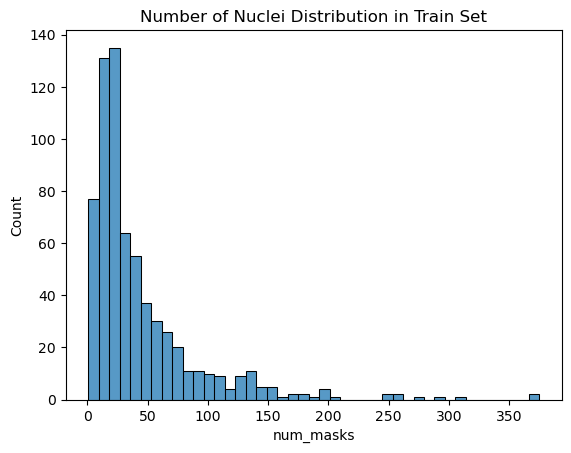

In [56]:
sns.histplot(data=df_image_train, x='num_masks').set_title('Number of Nuclei Distribution in Train Set');

**CONCLUSION**

- There is only `PNG` as **image format**  and `RGBA` as **image mode** (hence 4 channels for all images) in train set.
- There is no missing values
- A great majority of images has less than 50 nuclei. The number of masks i.e. nuclei varies quite snignificantly going from one nucleus to 375 nuclei.

### Global Analysis on Test Set

In [57]:
df_image_test.describe()

,height,width,num_channels,ratio
count,65.000000,65.000000,65.0,65.000000
mean,402.676923,393.184615,3.0,1.186171
std,129.082956,189.813386,0.0,0.631035
min,256.000000,161.000000,3.0,0.747126
25%,256.000000,256.000000,3.0,0.800000
50%,512.000000,256.000000,3.0,1.000000
75%,519.000000,640.000000,3.0,1.494253
max,524.000000,696.000000,3.0,3.223602


In [58]:
print("Number of image format in test set:", df_image_test['image_format'].unique())
print("Number of image mode in test set: \n", df_image_test['image_mode'].value_counts())

Number of image format in test set: ['PNG']
Number of image mode in test set: 
 RGBA    37
RGB     28
Name: image_mode, dtype: int64


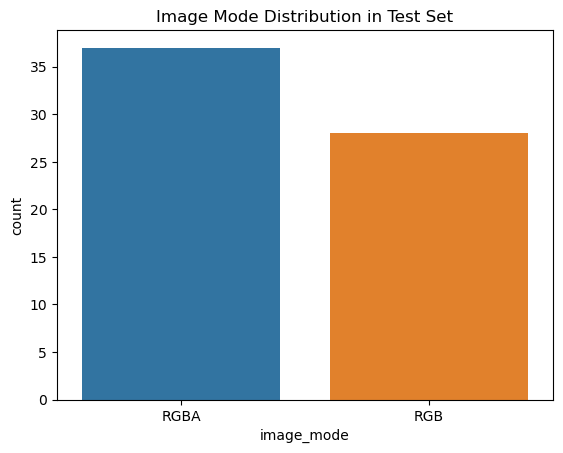

In [59]:
sns.countplot(data = df_image_test, x='image_mode').set_title('Image Mode Distribution in Test Set');

**CONCLUSION**
- The are two image modes in the test set `RGB`and `RGBA` which explains that we have images with 3 or 4 channels.
- It might be necessary to change image mode.
- The `ratio` varies quite significaantly from 0.74 to 3.22 and the distribution is quite different from train set.

### Global Analysis on Test Stage 2 Set

In [60]:
df_image_test_stage2.describe()

,height,width,num_channels,ratio
count,3019.000000,3019.000000,3019.0,3019.000000
mean,382.498841,430.915866,3.0,0.934841
std,137.426338,189.574600,0.0,0.194771
min,205.000000,231.000000,3.0,0.295389
25%,256.000000,256.000000,3.0,0.800000
50%,304.000000,320.000000,3.0,1.000000
75%,520.000000,574.000000,3.0,1.000000
max,1040.000000,1388.000000,3.0,1.787770


In [61]:
print("Number of image format in test set stage 2 \n", df_image_test_stage2['image_format'].value_counts())
print("Number of image mode in test set stage 2 \n", df_image_test_stage2['image_mode'].value_counts())

Number of image format in test set stage 2 
 PNG     3017
JPEG       1
TIFF       1
Name: image_format, dtype: int64
Number of image mode in test set stage 2 
 RGBA    2971
RGB       47
I          1
Name: image_mode, dtype: int64


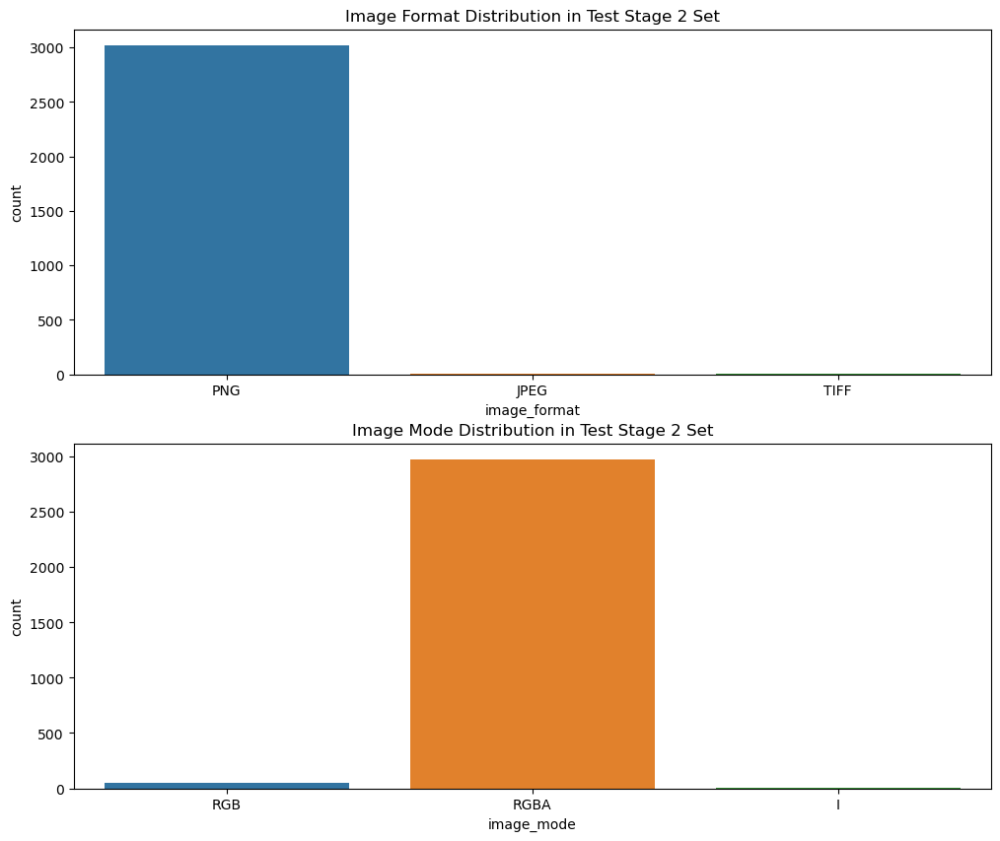

In [62]:
fig, axes = plt.subplots(2,figsize=(12,10))
sns.countplot(data = df_image_test_stage2, x='image_format', ax=axes[0]).set_title('Image Format Distribution in Test Stage 2 Set');
sns.countplot(data = df_image_test_stage2, x='image_mode', ax=axes[1]).set_title('Image Mode Distribution in Test Stage 2 Set');

**CONCLUSION**
- There are three `image format`, it might be necessary to homogenize it.
- There are three `image mode`, it might be necessary to homogenize it.
- The ratio distribution looks like more as train set than test stage 1 set.

### Conclusion

If might be useful to change image format and image mode.

## Visualizing images

### Random Images Without Edit

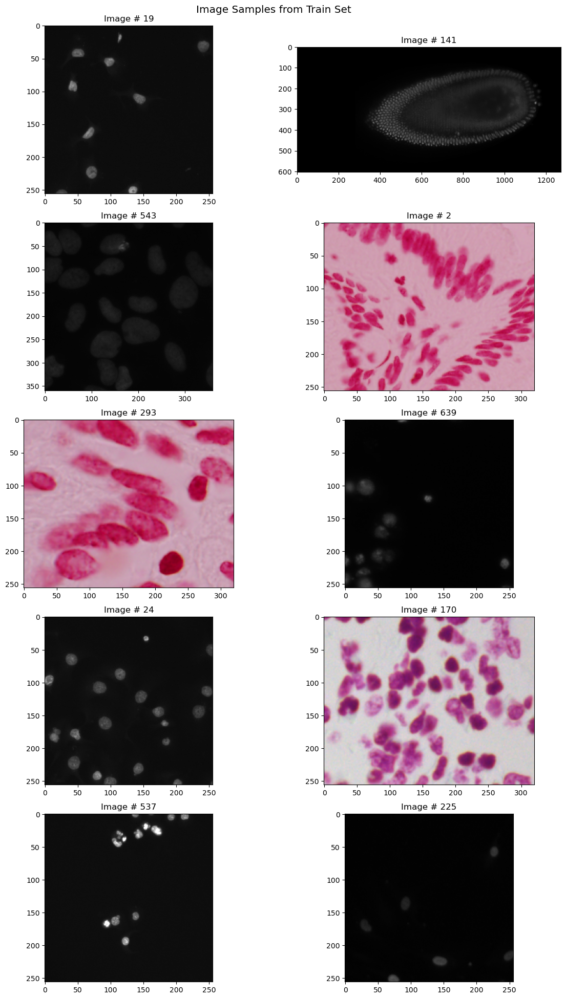

In [63]:
np.random.seed(27)
fig, axes = plt.subplots(5,2,figsize=(12,20))
fig.suptitle("Image Samples from Train Set", fontsize="x-large")
fig.tight_layout(pad=2)
for idx, i in enumerate(np.random.randint(0, len(df_image_train), 10)):
    axes[idx%5][idx//5].imshow(cv2.imread(df_image_train['image_path'][i])); # we do not convert OpenCV images into RGB as it is not necessary for our model
    axes[idx%5][idx//5].set_title(f"Image # {i}")

**CONCLUSION**
- We can see there is a **good variety of images' caracteristics** like:
    - `color`
    - `contrast`
- For these caracteristics, we need to **homogenize them**.

### Random Images With Color Edit

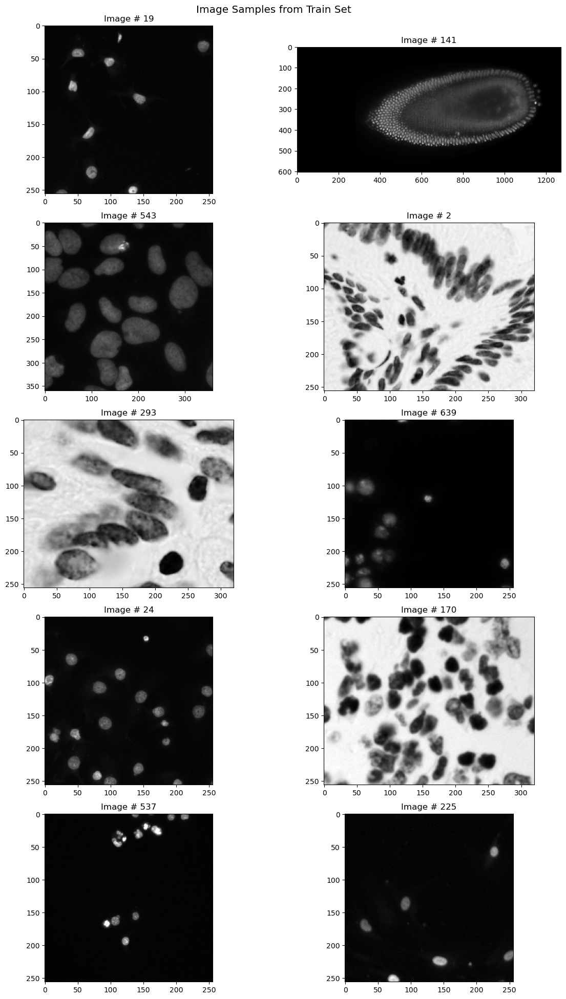

In [64]:
np.random.seed(27)
fig, axes = plt.subplots(5,2,figsize=(12,20))
fig.suptitle("Image Samples from Train Set", fontsize="x-large")
fig.tight_layout(pad=2)
for idx, i in enumerate(np.random.randint(0, len(df_image_train), 10)):
    axes[idx%5][idx//5].imshow(cv2.imread(df_image_train['image_path'][i], cv2.IMREAD_GRAYSCALE), cmap="gray");
    axes[idx%5][idx//5].set_title(f"Image # {i}")

**CONCLUSION**

With `GrayScale`, 
- we can have homogenized colors
- we can have a better contrast (at least with the human eyes), for example with image 543

### Random Images With Color Edit & With Corresponding Masks

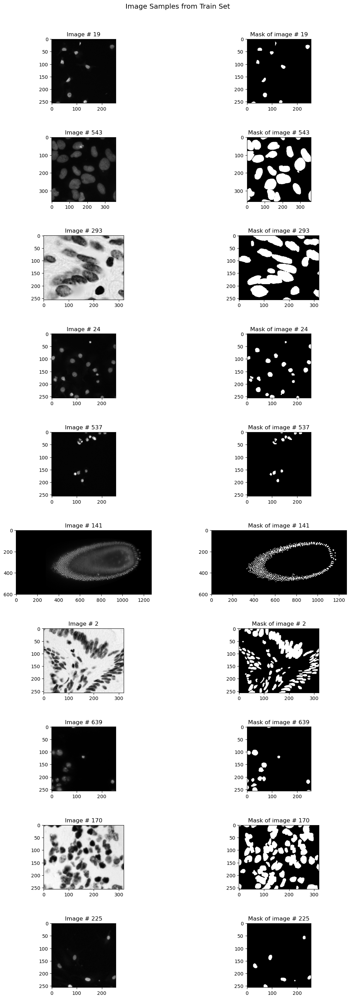

In [65]:
np.random.seed(27)
fig, axes = plt.subplots(10,2,figsize=(12,30))
fig.suptitle("Image Samples from Train Set", fontsize="x-large")
fig.tight_layout(pad=5)
for idx, i in enumerate(np.random.randint(0, len(df_image_train), 10)):
    axes[idx][0].imshow(cv2.imread(df_image_train['image_path'][i], cv2.IMREAD_GRAYSCALE), cmap="gray");
    axes[idx][0].set_title(f"Image # {i}")
    axes[idx][1].imshow(read_mask(df_mask_train,df_image_train['imageId'][i]), cmap="gray");
    axes[idx][1].set_title(f"Mask of image # {i}")

### Conclusion

We can see there are some different types of images based on:
- color or grayscale
- dimension
- background is light or black
- intensity of grays

Hence, `we need to homogenize` these aspects.

# Data Preprocessing

## Get, Resize Train & Test Datasets

In [66]:
# Get Train Data 
x_train = get_image_data(df_image_train, (128,128))
x_train.shape

(670, 128, 128, 3)

In [67]:
# Get Test Data 
x_test = get_image_data(df_image_test, (128,128))
x_test.shape

(65, 128, 128, 3)

In [68]:
# Get Stage 2 Test Data 
x_test_stage2 = get_image_data(df_image_test_stage2, (128,128))
x_test_stage2.shape

libpng warning: PLTE: ignored in grayscale PNG


(3019, 128, 128, 3)

- As we have seen above, we can see that there are some images have light or black background. Hence it will be necessary to invert for those with light background.
- The distribution for the Red, Green and Blue is quite similar for the train and the test sets

In [69]:
def img_intensity_pairplot(x):
    """Plot intensity distributions of color channels."""
    df = pd.DataFrame()
    df['Gray'] = np.mean(x[:,:,:,:], axis=(1,2,3))
    if x.shape[3]==3:
        df['Red'] = np.mean(x[:,:,:,0], axis=(1,2))
        df['Blue'] = np.mean(x[:,:,:,1], axis=(1,2))
        df['Green'] = np.mean(x[:,:,:,2], axis=(1,2))
    return df

In [70]:
#df_train_test_stage2 = get_mean_color_intensity(np.concatenate([x_train, x_test, x_test_stage2]))
#df_train_test_stage2['set'] = ['train']*len(x_train) + ['test']*len(x_test) + ['test_stage2']*len(x_test_stage2) 
#sns.pairplot(df_train_test, hue='set', diag_kind="hist");

Similarly, x_test_stage2 as a similar distribution as x_train

## Get, Resize & Grayscale Train & Test Datasets

In [71]:
# Rescaling and grayscaling data
x_train_scaled = get_image_data(df_image_train, (128,128), gray=True)
x_train_scaled.shape

(670, 128, 128, 1)

In [72]:
# Rescaling and grayscaling data
x_test_scaled = get_image_data(df_image_test, (128,128), gray=True)
x_test_scaled.shape

(65, 128, 128, 1)

In [73]:
# Rescaling and grayscaling data
x_test_stage2_scaled = get_image_data(df_image_test_stage2, (128,128), gray=True)
x_test_stage2_scaled.shape

libpng warning: PLTE: ignored in grayscale PNG


(3019, 128, 128, 1)

In [74]:
# Collecting Masks Data & Resizing them 
y_train = get_masks_data(df_image_train, df_mask_train, size=(128,128))
y_train.shape

(670, 128, 128, 1)

## Inverse Backgound

In [75]:
# Inversing background
x_train_inv = inverse_background(x_train_scaled)
x_test_inv = inverse_background(x_test_scaled)
x_test_stage2_inv = inverse_background(x_test_stage2_scaled)

## Sharpen Frontiers 

In [76]:
# Sharpening frontier for masks
y_train_sharp = sharpen_frontier(y_train)

## Normalize Data

In [77]:
# Normalizing data using method 1
x_train_prep = normalize_x(x_train_inv)
x_test_prep = normalize_x(x_test_inv)
x_test_stage2_prep = normalize_x(x_test_stage2_inv)
y_train_prep = normalize_x(y_train_sharp)

## Complete Preprocessing

In [78]:
def preprocess_data(df_image_train, df_mask_train, df_image_test, df_image_test_stage2, df_mask_test=None,
                    size=(128,128), method=1, inverse=True, grayscale=True, sharp=True, threshold=128, agg=False):
    
    if df_mask_test is not None: 
        df_image_train_agg = pd.concat([df_image_train.drop('num_masks',axis=1),df_image_test])
        x_train = get_image_data(df_image_train_agg, size, gray=grayscale)
        x_test = get_image_data(df_image_test, size, gray=grayscale)
        x_test_stage2 = get_image_data(df_image_test_stage2, size, gray=grayscale)
        y_train = get_masks_data(df_image_train, df_mask_train, size=size)
    else:
        x_train = get_image_data(df_image_train, size, gray=grayscale)
        x_test = get_image_data(df_image_test, size, gray=grayscale)
        x_test_stage2 = get_image_data(df_image_test_stage2, size, gray=grayscale)
        y_train = get_masks_data(df_image_train, df_mask_train, size=size)

    if inverse:
        x_train = inverse_background(x_train)
        x_test = inverse_background(x_test)
        x_test_stage2 = inverse_background(x_test_stage2)
    if sharp:
        y_train = sharpen_frontier(y_train, threshold=threshold)
    if method!=4:
        x_train = normalize_x(x_train, method=method)
        x_test = normalize_x(x_test, method=method)
        x_test_stage2 = normalize_x(x_test_stage2, method=method)
        #y_train = normalize_x(y_train_sharp, method=method)
        y_train = y_train/255.
        print(y_train.shape)
    else:
        x_train, mean, std = normalize_x(x_train, method=method)
        x_test = (x_test - mean)/std
        x_test_stage2 = (x_test_stage2 - mean)/std
        #y_train,_,_ = normalize_x(y_train, method=method)
        y_train = y_train/255.
    if df_mask_test is not None: 
        y_mask = np.expand_dims(np.array([i for i in df_mask_resized['mask']]),axis=3)
        y_mask = sharpen_frontier(y_mask, threshold=0.5)/255.
        y_train = np.concatenate((y_train,y_mask))
    
    return x_train, x_test ,x_test_stage2, y_train

In [79]:
# Preprocessing Data
x_train_prep,x_test_prep, x_test_stage2_prep, y_train_prep =  preprocess_data(df_image_train, df_mask_train, 
                                                                         df_image_test, df_image_test_stage2, 
                    size=(128,128), method=3, inverse=True, grayscale=True, sharp=True, threshold=128)

libpng warning: PLTE: ignored in grayscale PNG


(670, 128, 128, 1)


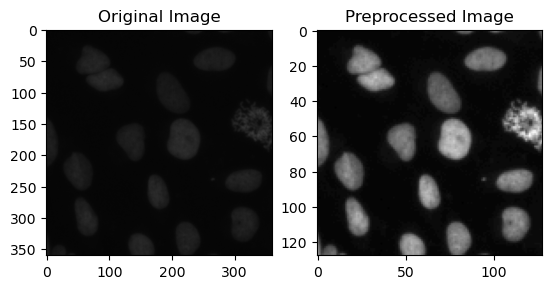

In [80]:
# Visualizing Data
fig, axes = plt.subplots(1,2)
axes[0].imshow(cv2.imread(df_image_train['image_path'][617]));
axes[0].set_title('Original Image');
axes[1].imshow(x_train_prep[617],cmap='gray');
axes[1].set_title('Preprocessed Image');

## Resizing images to orginal shape

In [39]:
def resize_correctly_one_image(init_image, width, height):
    return cv2.resize(init_image,(width, height))               

def resize_images(images, df_images):
    """
    Resize image arrays in the correct shape
    -------------
    inputs:
    - images: numpy Array, array of images arrays
    - df_images: pandas DataFrame, DataFrame containing the original shape of the images
    
    outputs:
    - numpy Array, array of images arrays with their original shape
    """
    preds_test_resized = []
    for i in range(0, len(images)):
        preds_test_resized.append(resize_correctly_one_image(images[i],df_images.iloc[i]['width'], df_images.iloc[i]['height']))
    return np.array(preds_test_resized)

## Functions for Output Formatting

In [40]:
def format_result_one_image(y,imageId, height=128, width=128):

    """ Format output results in the form of a DataFrame and run_length encoding
    inputs: 
        y: array of mask, shape (height, width, 1)
        imageId: string of the imageId
    """
    
    res_list = []
    y_train_lab = y.reshape(y.shape[0],y.shape[1])
    lab_mask, num = skimage.morphology.label(y_train_lab == np.max(y_train_lab),return_num=True)
    df = pd.DataFrame([imageId]*num,columns=['imageId'])
    for i in range(1, num+1):
        l = np.where(lab_mask.transpose().reshape(height*width) == i)[0]
        res = generate_data_submission(l)
        res_list.append(res)
    rank = np.argsort([val[0] for val in res_list])
    df['EncodedPixels'] = np.array([" ".join([str(s) for s in l]) for l in res_list])[rank]
    return df


def format_output_data_all(df_x, y):
    df_final = pd.DataFrame(columns=['imageId','EncodedPixels'])
    for i in range(0, len(df_x)):
        df_final = pd.concat([df_final,format_result_one_image(y[i],df_x['imageId'].iloc[i], 
                                                               df_x['height'].iloc[i], df_x['width'].iloc[i])])
    return df_final

In [41]:
y_train_res = resize_images(y_train, df_image_train)

In [42]:
df_final = format_output_data_all(df_image_train, y_train_res)

In [43]:
print("Length of output data using output formatting: ",len(df_final),
      "\nLength of output data from available data: ", len(df_mask_train)) 

Length of output data using output formatting:  25916 
Length of output data from available data:  29461


In [82]:
# Compare number of masks directly from files and from output formatting
df_compare = df_final.groupby('imageId').agg('size').to_frame("num_mask_formatting").reset_index().merge(df_image_train[['imageId','num_masks']],on='imageId')
df_compare

,imageId,num_mask_formatting,num_masks


We can see with formatting the data, `we have some differences between the actual number of masks and the number of masks coming from formatting.`

In [81]:
case_study = df_compare['imageId'].iloc[0]
case_study2 = df_compare['imageId'].iloc[2]

NameError: name 'df_compare' is not defined

In [46]:
index_case_study = df_image_train[df_image_train['imageId']==case_study].index[0]
index_case_study2 = df_image_train[df_image_train['imageId']==case_study2].index[0]
lab_mask, num = skimage.morphology.label(y_train[index_case_study] == np.max(y_train[index_case_study]),return_num=True)
lab_mask2, num2 = skimage.morphology.label(y_train[index_case_study2] == np.max(y_train[index_case_study2]),return_num=True)


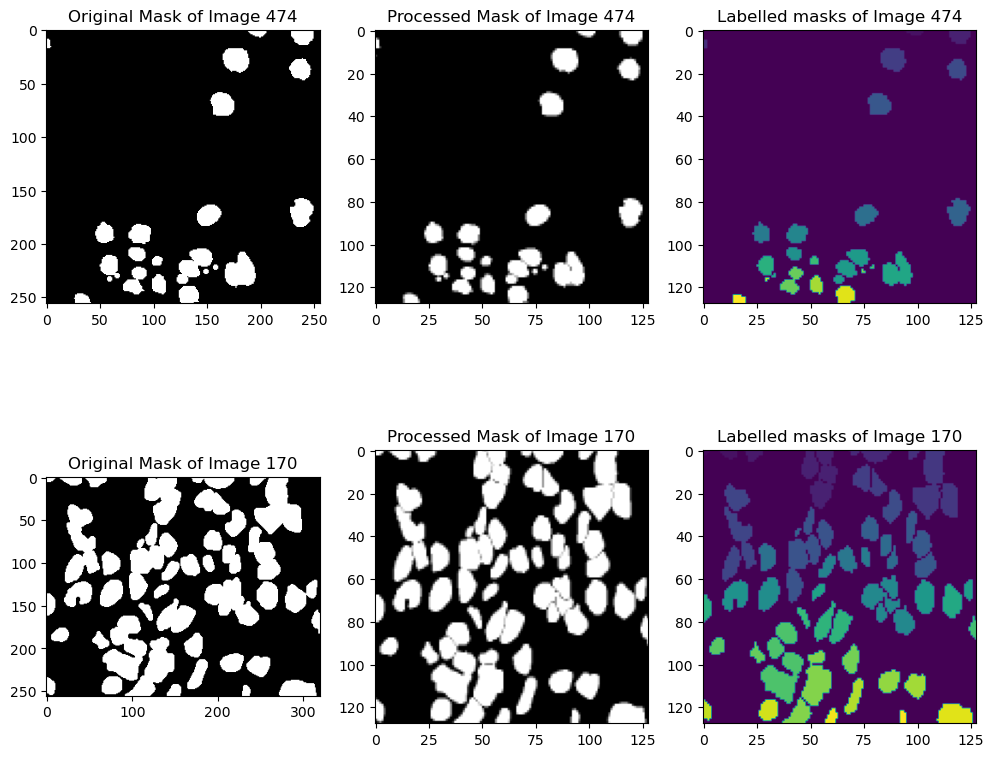

In [47]:
fig, axes = plt.subplots(2,3,figsize=(12,10))
axes[0][0].imshow(read_mask(df_mask_train,df_image_train['imageId'][index_case_study]), cmap="gray");
axes[0][0].set_title(f'Original Mask of Image {index_case_study}');
axes[0][1].imshow(y_train[index_case_study],cmap="gray");
axes[0][1].set_title(f'Processed Mask of Image {index_case_study}');
axes[0][2].imshow(lab_mask);
axes[0][2].set_title(f'Labelled masks of Image {index_case_study}');
axes[1][0].imshow(read_mask(df_mask_train,df_image_train['imageId'][index_case_study2]), cmap="gray");
axes[1][0].set_title(f'Original Mask of Image {index_case_study2}');
axes[1][1].imshow(y_train[index_case_study2],cmap="gray");
axes[1][1].set_title(f'Processed Mask of Image {index_case_study2}');
axes[1][2].imshow(lab_mask2);
axes[1][2].set_title(f'Labelled masks of Image {index_case_study2}');

We can see `there is a significant difference in terms of results just by formatting the data`. The main reason of that issue is the `overlapping or touching nuclei`.
We need to improve this in order to get better results.

## Splitting Cells

In [48]:
def split_touching_cells(eval_im):
    """
    inputs are binary masks 
    """
    eval_im_f = eval_im.copy()
    mini = eval_im_f.min()
    maxi = eval_im_f.max()
    eval_im_f[eval_im_f==mini]=0
    eval_im_f[eval_im_f==maxi]=1
    lab_mask,num = skimage.morphology.label(eval_im_f == np.max(eval_im_f),return_num=True, connectivity=1)
    locs = ndimage.find_objects(lab_mask)
    for idx,i in enumerate(locs):
        if eval_im_f[i].shape==(1,1,1):
            continue
        else: 
            tmp_lab_mask, tmp_num = skimage.morphology.label(eval_im_f[i] == np.max(eval_im_f[i]),return_num=True, connectivity=1)
            if tmp_num>1:
                val, counts = np.unique(tmp_lab_mask, return_counts=True)
                dico = dict(zip(val[1:],counts[1:]))
                maxi_lab = max(dico, key=dico.get)
                tmp_lab_mask = tmp_lab_mask.astype(float)
                tmp_lab_mask_rec = tmp_lab_mask.copy()
                tmp_lab_mask_rec[tmp_lab_mask_rec==maxi_lab] = 0
                tmp_lab_mask_rec[tmp_lab_mask_rec!=0] = 1
                tmp_lab_mask[tmp_lab_mask!=maxi_lab] = 0
            it = 1
            open1 = ndimage.binary_opening(np.squeeze(tmp_lab_mask),iterations=it).astype(int)
            tmp_lab_mask1, tmp_num1 = skimage.morphology.label(open1 == np.max(open1),return_num=True)
            while (open1.max()>0) & (tmp_num1==1):
                it+=1
                open1 = ndimage.binary_opening(np.squeeze(tmp_lab_mask),iterations=it).astype(int)
                tmp_lab_mask1, tmp_num1 = skimage.morphology.label(open1 == np.max(open1),return_num=True, connectivity=1)
            if (open1.max()>0) & (tmp_num1>1): 
                if tmp_num==1: 
                    eval_im_f[i] = np.expand_dims(open1,axis=2)
                else: 
                    eval_im_f[i] = (np.expand_dims(open1, axis=2) + tmp_lab_mask_rec)
    eval_im_f[eval_im_f==0]=mini
    eval_im_f[eval_im_f==1]=maxi
    return eval_im_f

In [49]:
y_train_updated = np.array(list(map(split_touching_cells, y_train)))

In [50]:
y_train_updated = resize_images(y_train_updated, df_image_train)
df_final_updated = format_output_data_all(df_image_train, y_train_updated)

In [51]:
print("Length of output data using output formatting: ",len(df_final),
      "\nLength of output data from available data: ", len(df_mask_train),
      "\nLength of output data using output formatting and splitting cells: ", len(df_final_updated)) 

Length of output data using output formatting:  25916 
Length of output data from available data:  29461 
Length of output data using output formatting and splitting cells:  25954


In [52]:
df_compare = df_final.groupby('imageId').agg('size').to_frame("num_mask_formatting").reset_index().merge(df_image_train[['imageId','num_masks']],on='imageId')
df_compare.merge(df_final_updated.groupby('imageId').agg('size').to_frame("num_mask_formatting_w_split").reset_index())

,imageId,num_mask_formatting,num_masks,num_mask_formatting_w_split
0,00071198d059ba7f5914a526d124d28e6d010c92466da2...,22,27,22
1,003cee89357d9fe13516167fd67b609a164651b2193458...,36,36,36
2,00ae65c1c6631ae6f2be1a449902976e6eb8483bf6b074...,63,70,63
3,0121d6759c5adb290c8e828fc882f37dfaf3663ec885c6...,71,86,71
4,01d44a26f6680c42ba94c9bc6339228579a95d0e2695b1...,7,7,7
...,...,...,...,...
665,fec226e45f49ab81ab71e0eaa1248ba09b56a328338dce...,13,13,13
666,feffce59a1a3eb0a6a05992bb7423c39c7d52865846da3...,37,38,37
667,ff3407842ada5bc18be79ae453e5bdaa1b68afc842fc22...,18,19,18
668,ff3e512b5fb860e5855d0c05b6cf5a6bcc7792e4be1f0b...,12,13,12


We can see that there is `a slight improvements with the split process` in terms of cells detected enven if the gap is still important.

## Scoring Function

In [53]:
def mask_to_masks_array(lab_mask):
    masks_array = []
    for i in range(1,num+1):
        tmp_lab = lab_mask.copy()
        tmp_lab[tmp_lab!=i]=0
        tmp_lab = tmp_lab/i
        masks_array.append(tmp_lab)
        return np.array(masks_array)

In [54]:
def intersect_o_union(A,B):
    """
    compute Intersection over Union
    inputs:
    A: BINARY array. shape(128, 128, 1)
    B: BINARY array. shape(128, 128, 1)
    """
    intersect = (A & B)
    union = (A | B)
    return intersect.sum().sum()/union.sum().sum()


def true_positive_test(pred_image, masks_array, t):
    """ 
    Compute whether there is a True Positive or no
    inputs:
    - pred_image: predicted image where its values equal 0 or 1. Shape: (128, 128, 1)
    - masks_array: list of all masks for a specific image where its values equal 0 or 1. 
                   Shape (# masks, shape1, shape2, shape3)
    """
    res = False
    index=-1
    for idx , mask in enumerate(masks_array):
        if intersect_o_union(pred_image,mask)>t:
            res=True
            index=idx
    return res, index

def precision_calculus(pred_masks, masks_array):
    """
    pred_masks: all predicted masks for one image. shape: (#pred_masks, 128, 128, 1)
    masks_array: ground truth masks for one image. shape: (#masks, 128, 128, 1)
    """
    true_obj_nb = len(masks_array)
    thresholds = np.arange(0.5,1,0.05)
    precision = 0
    for t in thresholds:
        fn_array = np.ones(true_obj_nb)
        tp_count = 0
        fp_count = 0
        for mask_pred in pred_masks:
            tp, idx = true_positive_test(mask_pred,masks_array,t)
            if tp:
                tp_count += 1
                fn_array[idx] = 0
            else:
                fp_count+=1
        precision += tp_count/(tp_count+fp_count+sum(fn_array))
    return precision/len(thresholds)

def get_score(y_pred, y_true):
    """Compute the score for a batch of samples.
    y_pred: batch of predicted masks. shape: (#batch_size, 128, 128, 1)
    y_true: batch of true masks. shape: (#batch_size, 128, 128, 1)"""
    scores = []
    for i in range(len(y_true)):
        y_true_masks = mask_to_labeled_masks_array(y_true[i], np.max(y_true[i]))
        # ATTENTION ICI, IL VA FALLOIR PROBABLEMENT CHANGER np.max(y_pred[i]) PAR 0.5
        y_pred_masks = mask_to_labeled_masks_array(y_pred[i], np.max(y_pred[i]))
        score = precision_calculus(y_true_masks.astype(int), y_pred_masks.astype(int))
        scores.append(score)
    return np.array(scores)


def mask_to_labeled_masks_array(y, threshold):
    """
    Convert a labeled mask (containing x labels) into an array of x masks
    inputs: lab_mask shape(128, 128, 1)
    outputs: array of masks with O and 1 values. shape: (x, 128, 128, 1)
    """
    lab_mask, num = skimage.morphology.label(y>=threshold,return_num=True)
    masks_array = []
    for i in range(1,num+1):
        tmp_lab = lab_mask.copy()
        tmp_lab[tmp_lab!=i]=0
        tmp_lab = tmp_lab/i
        masks_array.append(tmp_lab)
    return np.array(masks_array)

Testing the Scoring Function on different cases

In [ ]:
# Ground truth values
masks_array = mask_to_labeled_masks_array(y_train[665], np.max(y_train[665]))
masks_array = masks_array.astype(int)

# Ground truth values #2 (basically a copy)
lab_mask, num = skimage.morphology.label(y_train[665],return_num=True)

# We took off the last cell => We add a false negative component
lab_mask_altered = lab_mask.copy()
lab_mask_altered[lab_mask_altered==16] = 0

# We took off the last cell & add a fake one => We add a false negative component & a false positive
lab_mask_altered2 = lab_mask_altered.copy()
lab_mask_altered2[0:10,120:] = np.ones((10,8,1))*16

# We format the data in the shape(#number of cells, 128, 128, 1) & with binary values
dico = dict()
for i in range(1,num+1):
    val1 = lab_mask.copy()
    val1[val1!=i]=0
    val1 = val1/i
    #val1 = val1.reshape((128,128))
    dico[f'val{i}'] = val1.astype(int)
mask_pred = np.array(list(dico.values()))

# We format the data in the shape(#number of cells, 128, 128, 1) & with binary values
dico_altered = dict()
for i in range(1,num):
    val1 = lab_mask_altered.copy()
    val1[val1!=i]=0
    val1 = val1/i
    #val1 = val1.reshape((128,128))
    dico_altered[f'val{i}'] = val1.astype(int)
mask_pred_altered = np.array(list(dico_altered.values()))

# We format the data in the shape(#number of cells, 128, 128, 1) & with binary values
dico_altered2 = dict()
for i in range(1,num+1):
    val1 = lab_mask_altered2.copy()
    val1[val1!=i]=0
    val1 = val1/i
    #val1 = val1.reshape((128,128))
    dico_altered2[f'val{i}'] = val1.astype(int)
mask_pred_altered2 = np.array(list(dico_altered2.values()))

In [ ]:
fig, axes = plt.subplots(1,3, figsize=(12, 6))
axes[0].imshow(lab_mask)
axes[0].set_title("Original Mask")
axes[1].imshow(lab_mask_altered)
axes[1].set_title("Mask with a Missing Cell")
axes[2].imshow(lab_mask_altered2)
axes[2].set_title("Mask with a Missing Cell and Fake Cell")

Test on same data => score = 1

In [ ]:
precision_calculus(mask_pred, masks_array)

Test on data slightly different (same cells with one missing) => score < 1

In [ ]:
precision_calculus(mask_pred_altered, masks_array)

Test on data different (some similar cells + one cell missing + one fake cell) => score < 1

In [ ]:
precision_calculus(mask_pred_altered2, masks_array)

Test on several images

In [ ]:
y_pred = y_train[0:5].copy()
y_true = y_train[0:5].copy()

In [ ]:
get_score(y_pred, y_true)

# U-Net Models

One efficient model for a semantic segmentation task is `UNet models`. 

We will see below what is it and how to implement it.

## U-Net x 128*128 & 1 channel

![](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png)

In [103]:
def initialize_u_net_model(loss = 'binary_crossentropy'):
    
    input_layer = Input(shape=(HEIGHT, WIDTH, DEPTH), dtype=tf.float16)
    
    # x = layers.Rescaling(1./255)(x)

    c1 = layers.Conv2D(16,(3,3), input_shape=((HEIGHT, WIDTH, DEPTH)), padding="same")(input_layer)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.Activation("relu")(c1)
    c1 = layers.Conv2D(16,(3,3),padding="same")(c1)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.Activation("relu")(c1)

    m1 = layers.MaxPooling2D(padding="same")(c1)
    c2 = layers.Conv2D(32,(3,3), padding="same")(m1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.Activation("relu")(c2)
    c2 = layers.Conv2D(32,(3,3),padding="same")(c2)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.Activation("relu")(c2)

    m2 = layers.MaxPooling2D(padding="same")(c2)
    c3 = layers.Conv2D(64,(3,3), padding="same")(m2)
    c3 = layers.BatchNormalization()(c3)
    c3 = layers.Activation("relu")(c3)
    c3 = layers.Conv2D(64,(3,3),padding="same")(c3)
    c3 = layers.BatchNormalization()(c3)
    c3 = layers.Activation("relu")(c3)

    m3 = layers.MaxPooling2D(padding="same")(c3)
    c4 = layers.Conv2D(128,(3,3), padding="same")(m3)
    c4 = layers.BatchNormalization()(c4)
    c4 = layers.Activation("relu")(c4)
    c4 = layers.Conv2D(128,(3,3),padding="same")(c4)
    c4 = layers.BatchNormalization()(c4)
    c4 = layers.Activation("relu")(c4)

    m4 = layers.MaxPooling2D(padding="same")(c4)
    c5 = layers.Conv2D(256,(3,3), padding="same")(m4)
    c5 = layers.BatchNormalization()(c5)
    c5 = layers.Activation("relu")(c5)
    c5 = layers.Conv2D(256,(3,3),padding="same")(c5)
    c5 = layers.BatchNormalization()(c5)
    c5 = layers.Activation("relu")(c5)

    u1 = layers.Conv2DTranspose(128,(2,2),strides=(2,2),padding="same")(c5)
    c6 = layers.concatenate([c4, u1])
    c6 = layers.Conv2D(128,(3,3), padding="same")(c6)
    c6 = layers.BatchNormalization()(c6)
    c6 = layers.Activation("relu")(c6)
    c6 = layers.Conv2D(128,(3,3),padding="same")(c6)
    c6 = layers.BatchNormalization()(c6)
    c6 = layers.Activation("relu")(c6)

    u2 = layers.Conv2DTranspose(64,(2,2),strides=(2,2),padding="same")(c6)
    c7 = layers.concatenate([c3, u2])
    c7 = layers.Conv2D(64,(3,3), padding="same")(c7)
    c7 = layers.BatchNormalization()(c7)
    c7 = layers.Activation("relu")(c7)
    c7 = layers.Conv2D(64,(3,3),padding="same")(c7)
    c7 = layers.BatchNormalization()(c7)
    c7 = layers.Activation("relu")(c7)

    u3 = layers.Conv2DTranspose(32,(2,2),strides=(2,2),padding="same")(c7)
    c8 = layers.concatenate([c2, u3])
    c8 = layers.Conv2D(32,(3,3), padding="same")(c8)
    c8 = layers.BatchNormalization()(c8)
    c8 = layers.Activation("relu")(c8)
    c8 = layers.Conv2D(32,(3,3),padding="same")(c8)
    c8 = layers.BatchNormalization()(c8)
    c8 = layers.Activation("relu")(c8)

    u4 = layers.Conv2DTranspose(16,(2,2),strides=(2,2),padding="same")(c8)
    c9 = layers.concatenate([c1, u4])
    c9 = layers.Conv2D(16,(3,3), padding="same")(c9)
    c9 = layers.BatchNormalization()(c9)
    c9 = layers.Activation("relu")(c9)
    c9 = layers.Conv2D(16,(3,3),padding="same")(c9)
    c9 = layers.BatchNormalization()(c9)
    c9 = layers.Activation("relu")(c9)

    outputs = layers.Conv2D(1,(1,1),padding="same", activation='sigmoid')(c9)

    model = Model(inputs=[input_layer], outputs=[outputs])
    model.compile(optimizer='adam', loss=loss, metrics=["accuracy"])
    return model

In [65]:
HEIGHT = 128
WIDTH = 128
DEPTH = 1
model = initialize_u_net_model()

In [69]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 16  160         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

 batch_normalization_9 (BatchNo  (None, 8, 8, 256)   1024        ['conv2d_9[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 activation_9 (Activation)      (None, 8, 8, 256)    0           ['batch_normalization_9[0][0]']  
                                                                                                  
 conv2d_transpose (Conv2DTransp  (None, 16, 16, 128)  131200     ['activation_9[0][0]']           
 ose)                                                                                             
                                                                                                  
 concatenate (Concatenate)      (None, 16, 16, 256)  0           ['activation_7[0][0]',           
                                                                  'conv2d_transpose[0][0]']       
          

 batch_normalization_17 (BatchN  (None, 128, 128, 16  64         ['conv2d_17[0][0]']              
 ormalization)                  )                                                                 
                                                                                                  
 activation_17 (Activation)     (None, 128, 128, 16  0           ['batch_normalization_17[0][0]'] 
                                )                                                                 
                                                                                                  
 conv2d_18 (Conv2D)             (None, 128, 128, 1)  17          ['activation_17[0][0]']          
                                                                                                  
Total params: 1,946,705
Trainable params: 1,943,761
Non-trainable params: 2,944
__________________________________________________________________________________________________


In [947]:
"""
# If we need to train again the model we can uncomment this cell

# Fit model
earlystopper = EarlyStopping(patience=5, verbose=1)
#checkpointer = ModelCheckpoint('model-dsbowl2018-u_net_128_1.h5', verbose=1, save_best_only=True)
results = model.fit(x_train_prep, y_train_prep, validation_split=0.1, batch_size=16, epochs=50, 
                    callbacks=[earlystopper, checkpointer])
                    
"""

Epoch 1/50


2023-04-24 16:02:57.890332: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


38/38 [==============================] - ETA: 0s - loss: 0.3607 - accuracy: 0.9205

2023-04-24 16:03:06.208184: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.



Epoch 1: val_loss did not improve from 0.06150
38/38 [==============================] - 11s 203ms/step - loss: 0.3607 - accuracy: 0.9205 - val_loss: 0.4997 - val_accuracy: 0.9356
Epoch 2/50
38/38 [==============================] - ETA: 0s - loss: 0.2237 - accuracy: 0.9585
Epoch 2: val_loss did not improve from 0.06150
38/38 [==============================] - 5s 121ms/step - loss: 0.2237 - accuracy: 0.9585 - val_loss: 0.3676 - val_accuracy: 0.9338
Epoch 3/50
38/38 [==============================] - ETA: 0s - loss: 0.1828 - accuracy: 0.9616
Epoch 3: val_loss did not improve from 0.06150
38/38 [==============================] - 4s 102ms/step - loss: 0.1828 - accuracy: 0.9616 - val_loss: 0.2682 - val_accuracy: 0.9436
Epoch 4/50
38/38 [==============================] - ETA: 0s - loss: 0.1607 - accuracy: 0.9598
Epoch 4: val_loss did not improve from 0.06150
38/38 [==============================] - 4s 98ms/step - loss: 0.1607 - accuracy: 0.9598 - val_loss: 0.2070 - val_accuracy: 0.9517
Epoch

In [83]:
# Load trained model
model = load_model('model-dsbowl2018-u_net_128_1.h5')

Metal device set to: Apple M2


In [88]:
# Predict on train, val et test sets
preds_train = model.predict(x_train_prep[:int(x_train_prep.shape[0]*0.9)], verbose=1)
preds_val = model.predict(x_train_prep[int(x_train_prep.shape[0]*0.9):], verbose=1)
preds_test = model.predict(x_test_prep, verbose=1)

# Convert train, val et test sets
preds_train = (preds_train*255).astype(np.uint8)
preds_val = (preds_val*255).astype(np.uint8)
preds_test = (preds_test*255).astype(np.uint8)

# Threshold predictions
preds_train_final = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_train])
preds_val_final = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_val])
preds_test_final = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_test])

3/3 [==============================] - 0s 111ms/step


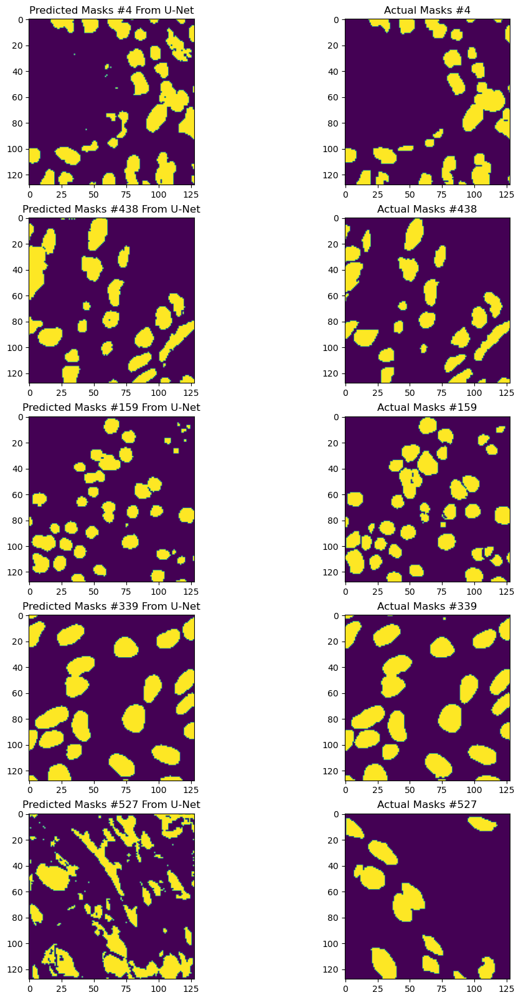

In [89]:
#Display some results from training data
fig , axes = plt.subplots(5,2, figsize=(12,20))
vals = np.random.randint(0,len(preds_train_final),5)
for idx, i in enumerate(vals):
    axes[idx][0].imshow(preds_train_final[i])
    axes[idx][0].set_title(f"Predicted Masks #{i} From U-Net")
    axes[idx][1].imshow(y_train_prep[i])
    axes[idx][1].set_title(f"Actual Masks #{i}")
#get_score(preds_train_final[vals],y_train_prep[vals])

### Comparing Results with Stage 1 Test Solution

In this Kaggle, we have the solutions from the stage 1 test. As in the previous part, we have not trained our model using these stage 1 data, it is interesting to see how our model performs on new data.

#### Resizing Images in Their Original Shapes

First, we will need to resize our predicted data in order to compare them with the solution. (We do so and not resizing the solution as we will have to do so in order to upload our results)

In [90]:
# Resize the predicted images
preds_test_resized = resize_images(preds_test_final, df_image_test)

In [91]:
# Read the stage 1 solution
df_image_test_solution = pd.read_csv("stage1_solution.csv")
df_image_test_solution.head()

,ImageId,EncodedPixels,Height,Width,Usage
0,0114f484a16c152baa2d82fdd43740880a762c93f436c8...,31632 6 31886 10 32139 14 32394 15 32649 17 32...,256,256,Public
1,0114f484a16c152baa2d82fdd43740880a762c93f436c8...,50280 7 50534 10 50788 13 51043 14 51298 16 51...,256,256,Public
2,0114f484a16c152baa2d82fdd43740880a762c93f436c8...,10892 5 11146 9 11401 10 11656 11 11911 13 121...,256,256,Public
3,0114f484a16c152baa2d82fdd43740880a762c93f436c8...,45104 8 45359 10 45614 12 45869 14 46124 15 46...,256,256,Public
4,0114f484a16c152baa2d82fdd43740880a762c93f436c8...,38564 4 38819 6 39074 8 39327 11 39582 12 3983...,256,256,Public


#### Read Encoded Results

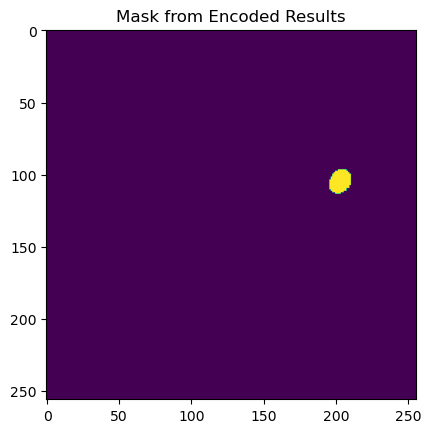

In [96]:
# Plot an example
fig, ax1 = plt.subplots(1,1)
ax1.imshow(read_encoded_image(df_image_test_solution['EncodedPixels'][1],df_image_test_solution.iloc[1]['Height'], df_image_test_solution.iloc[1]['Width']));
ax1.set_title('Mask from Encoded Results');

#### Compare Results

In [97]:
# We compute the aggregated masks for all the images from stage 1 test
df_mask = pd.DataFrame(columns=['imageid','mask'])
for idx, i in enumerate(df_image_test_solution['ImageId'].unique()):
    tmp_list = [i]
    tmp_list.append(get_agg_mask_from_encoded(df_image_test_solution, i))
    df_mask.loc[idx] = tmp_list

In [98]:
# As the image order is not the same in the stage 1 and stage 1 solution, 
# we merge the data to get the same order
df_image_test_w_solution = df_image_test.merge(df_mask, left_on="imageId", right_on="imageid")

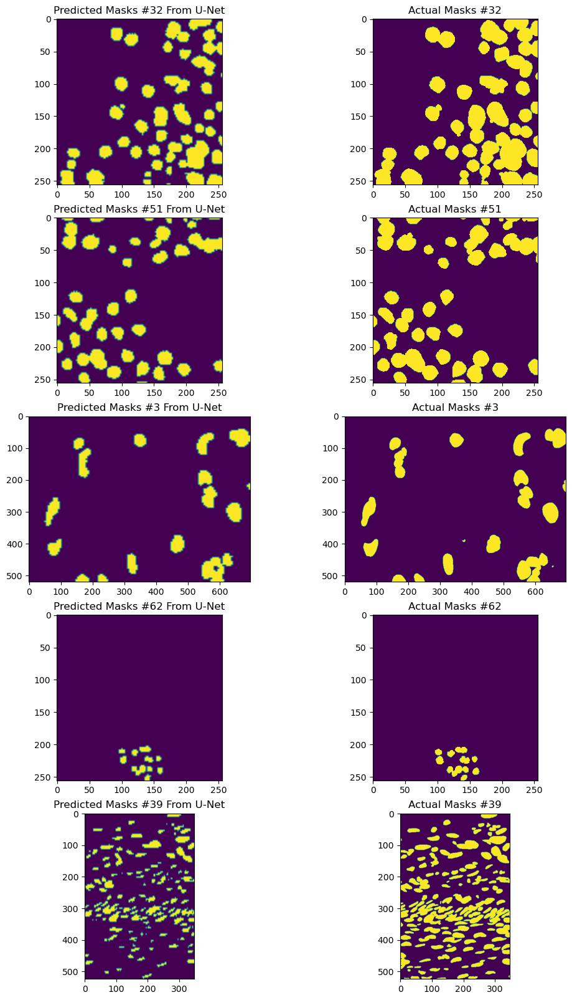

In [99]:
# We plot some results from predicted masks from U-Net model and the actual solution
fig , axes = plt.subplots(5,2, figsize=(12,20))
vals = np.random.randint(0,len(preds_test_resized),5)
for idx, i in enumerate(vals):
    axes[idx][0].imshow(preds_test_resized[i])
    axes[idx][0].set_title(f"Predicted Masks #{i} From U-Net")
    axes[idx][1].imshow(df_image_test_w_solution['mask'].loc[i])
    axes[idx][1].set_title(f"Actual Masks #{i}")
    #print(get_score(np.expand_dims(np.expand_dims(preds_test_resized[vals][idx], axis=2),axis=0),
    #      np.expand_dims(np.expand_dims(df_image_test_w_solution['mask'].iloc[vals].iloc[idx],axis=2),axis=0)))

### Training on Train dataset + Stage 1 Dataset

In [100]:
# We compute the aggregated masks for all the images from stage 1 test
df_image_test_solution = pd.read_csv("stage1_solution.csv")
df_mask_resized = pd.DataFrame(columns=['imageid','mask'])
for idx, i in enumerate(np.sort(df_image_test_solution['ImageId'].unique())):
    tmp_list = [i]
    tmp_list.append(get_agg_mask_from_encoded(df_image_test_solution, i, size=(128,128)))
    df_mask_resized.loc[idx] = tmp_list

In [101]:
df_image_test = df_image_test.sort_values(by='imageId')
df_mask_resized = df_mask_resized.sort_values(by='imageid')
x_train_prep_agg,x_test_prep_agg, x_test_stage2_prep_agg, y_train_prep_agg =  preprocess_data(df_image_train, 
                                                                         df_mask_train, df_image_test, 
                                                                         df_image_test_stage2, 
                                                                         df_mask_test=df_mask_resized,
                    size=(128,128), method=3, inverse=True, grayscale=True, sharp=True, threshold=128)

libpng warning: PLTE: ignored in grayscale PNG


(670, 128, 128, 1)


In [104]:
# Set up variables
HEIGHT = 128
WIDTH = 128
DEPTH = 1

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 16  160         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

 batch_normalization_9 (BatchNo  (None, 8, 8, 256)   1024        ['conv2d_9[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 activation_9 (Activation)      (None, 8, 8, 256)    0           ['batch_normalization_9[0][0]']  
                                                                                                  
 conv2d_transpose (Conv2DTransp  (None, 16, 16, 128)  131200     ['activation_9[0][0]']           
 ose)                                                                                             
                                                                                                  
 concatenate (Concatenate)      (None, 16, 16, 256)  0           ['activation_7[0][0]',           
                                                                  'conv2d_transpose[0][0]']       
          

 batch_normalization_17 (BatchN  (None, 128, 128, 16  64         ['conv2d_17[0][0]']              
 ormalization)                  )                                                                 
                                                                                                  
 activation_17 (Activation)     (None, 128, 128, 16  0           ['batch_normalization_17[0][0]'] 
                                )                                                                 
                                                                                                  
 conv2d_18 (Conv2D)             (None, 128, 128, 1)  17          ['activation_17[0][0]']          
                                                                                                  
Total params: 1,946,705
Trainable params: 1,943,761
Non-trainable params: 2,944
__________________________________________________________________________________________________


In [1498]:
"""
# If we need to train again the model we can uncomment this cell

model = initialize_u_net_model()
model.summary()

# Fit model
earlystopper = EarlyStopping(patience=5, verbose=1)
#checkpointer = ModelCheckpoint('model-dsbowl2018-u_net_128_1_stage1.h5', verbose=1, save_best_only=True)
results = model.fit(x_train_prep_agg, y_train_prep_agg, validation_split=0.1, batch_size=16, epochs=50, 
                    callbacks=[earlystopper, checkpointer])
                    
"""

Epoch 1/50


2023-04-26 11:27:45.132895: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


42/42 [==============================] - ETA: 0s - loss: 0.3601 - accuracy: 0.9223

2023-04-26 11:27:57.454570: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.



Epoch 1: val_loss improved from inf to 0.47427, saving model to model-dsbowl2018-u_net_128_1_stage1.h5
42/42 [==============================] - 16s 231ms/step - loss: 0.3601 - accuracy: 0.9223 - val_loss: 0.4743 - val_accuracy: 0.9368
Epoch 2/50
42/42 [==============================] - ETA: 0s - loss: 0.2241 - accuracy: 0.9578
Epoch 2: val_loss improved from 0.47427 to 0.35168, saving model to model-dsbowl2018-u_net_128_1_stage1.h5
42/42 [==============================] - 5s 117ms/step - loss: 0.2241 - accuracy: 0.9578 - val_loss: 0.3517 - val_accuracy: 0.9340
Epoch 3/50
42/42 [==============================] - ETA: 0s - loss: 0.1804 - accuracy: 0.9601
Epoch 3: val_loss improved from 0.35168 to 0.24830, saving model to model-dsbowl2018-u_net_128_1_stage1.h5
42/42 [==============================] - 4s 106ms/step - loss: 0.1804 - accuracy: 0.9601 - val_loss: 0.2483 - val_accuracy: 0.9464
Epoch 4/50
41/42 [============================>.] - ETA: 0s - loss: 0.1575 - accuracy: 0.9606
Epoch 

In [92]:
# Load Trained Model
model = load_model('model-dsbowl2018-u_net_128_1_stage1.h5')

In [94]:
# Make Predictions
preds_test_stage2_agg = model.predict(x_test_stage2_prep_agg, verbose=1)

# Rescale Data and transform Them into Integer
preds_test_stage2_agg = (preds_test_stage2_agg*255).astype(np.uint8)

# Resize Images
preds_test_stage2_agg_resized = resize_images(preds_test_stage2_agg, df_image_test_stage2)

# Threshold to get binary masks
pred_final = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_test_stage2_agg_resized])

# Run-Length Encode 
df_results_unet = format_output_data_all(df_image_test_stage2, pred_final).sort_values(by='imageId')

# Save Results
df_results_unet.to_csv('res_unet.csv',index=False)

95/95 [==============================] - 5s 52ms/step


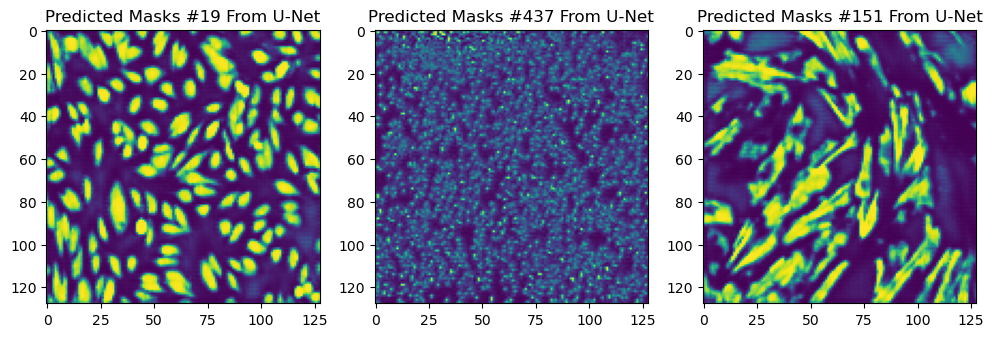

In [96]:
#Display some results from training data
fig , axes = plt.subplots(1,3, figsize=(12,20))
vals = np.random.randint(0,len(preds_train_final),3)
for idx, i in enumerate(vals):
    axes[idx].imshow(preds_test_stage2_agg[i])
    axes[idx].set_title(f"Predicted Masks #{i} From U-Net")

Score in Private LeaderBoard **0.43121**

#### Retreating Outputs

##### Removing Too Small Predicted Cells

We can see sometimes in the predictions some very small detections which are not nuclei but residues. It is better to delete these small detections. 

In [97]:
# Deleteing small cells
preds_test_stage2_agg_resized_retreated = remove_too_small_cells(pred_final, threshold=0.03)


In [477]:
# Formatting for submission
df_results_unet_wo_small = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_resized_retreated).sort_values(by='imageId')

df_results_unet_wo_small.to_csv('res_unet_wo_small.csv',index=False)


Top Score in Private LeaderBoard: **0.48361**

We can see we have a `strong improvements by doing so`.

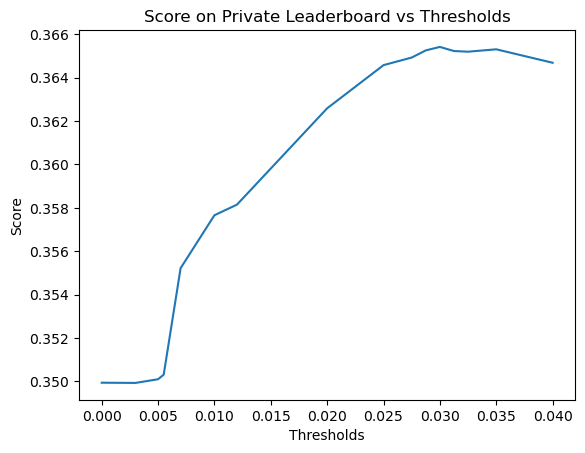

In [105]:
# Scores depending on thresholds size for deleting detection. This is based on old results.
thresholds = [0, 0.003, 0.005, 0.0055, 0.007, 0.01, 0.012, 0.02, 0.03, 0.04, 0.025, 0.0275, 0.02875, 0.035, 0.0325, 0.03125]
results = [0.34994, 0.34993, 0.3501, 0.35031, 0.35522, 0.35766, 0.35815, 0.36259, 0.36542, 0.36469, 0.36458, 0.36493, 0.36526, 0.36531, 0.3652, 0.36523]

ax = sns.lineplot(x=thresholds, y=results);
ax.set_title('Score on Private Leaderboard vs Thresholds')
plt.xlabel('Thresholds');
plt.ylabel('Score');

##### Splitting Merged Cells

Another important thing that deteriorates the results, is the touching cells. We will try to split them and see the impact on results.

In [479]:
preds = np.array([np.expand_dims(xi,axis=2) for xi in pred_final])

In [480]:
preds_test_stage2_agg_resized_splitted = np.array(list(map(split_touching_cells, preds)))

In [481]:
df_results_unet_splitted = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_resized_splitted).sort_values(by='imageId')


df_results_unet_splitted.to_csv('res_unet_splitted.csv',index=False)


Score in Private LeaderBoard: **0.4209**

`The results are worse than without processed`, the method seems to be too dummy to provide a true improvements.

##### Combining Both - taking off too small predicted cells then splitting cells

In [483]:
preds_test_stage2_agg_resized_retreated_splitted = remove_too_small_cells(pred_final, threshold=0.03)


In [484]:
preds_splitted = np.array([np.expand_dims(xi,axis=2) for xi in preds_test_stage2_agg_resized_retreated_splitted])



In [485]:
preds_test_stage2_agg_resized_retreated_splitted = np.array(list(map(split_touching_cells, preds_splitted)))

In [486]:
df_results_unet_retreated_splitted = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_resized_retreated_splitted).sort_values(by='imageId')

df_results_unet_retreated_splitted.to_csv('res_unet_retreated_splitted.csv',index=False)


Score in Private LeaderBoard: **0.46219**

##### Combining Both - taking off too small predicted cells then splitting cells

In [487]:
preds_splitted = np.array([np.expand_dims(xi,axis=2) for xi in pred_final])

preds_test_stage2_agg_resized_splitted_retreated = np.array(list(map(split_touching_cells, preds_splitted)))

In [488]:
preds_test_stage2_agg_resized_splitted_retreated = remove_too_small_cells(preds_test_stage2_agg_resized_splitted_retreated, threshold=0.03)


In [489]:
df_results_unet_splitted_retreated = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_resized_splitted_retreated).sort_values(by='imageId')


df_results_unet_splitted_retreated.to_csv('res_unet_splitted_retreated.csv',index=False)


Score in Private LeaderBoard: **0.46859**

## U-Net x 128*128 & 3 channels

One possiility to improve results is to use more channels, more precisely using RGB channels instead of grayscale.

### Comparing results with Stage 1 Test Set

In [109]:
# Using RGB channels instead of grayscale channel
x_train_prep_rgb, x_test_prep_rgb, x_test_stage2_prep_rgb, y_train_prep_rgb =  preprocess_data(df_image_train, df_mask_train, 
                                                                         df_image_test, df_image_test_stage2, 
                    size=(128,128), method=3, inverse=True, grayscale=False, sharp=True, threshold=128)



libpng warning: PLTE: ignored in grayscale PNG


(670, 128, 128, 1)


In [99]:
HEIGHT = 128
WIDTH = 128
DEPTH = 3

In [935]:
"""
# If we need to train again the model we can uncomment this cell

model = initialize_u_net_model()
model.summary()

# Fit model
earlystopper = EarlyStopping(patience=5, verbose=1)
#checkpointer = ModelCheckpoint('model-dsbowl2018-u_net_128_3.h5', verbose=1, save_best_only=True)
results = model_rgb.fit(x_train_prep_rgb, y_train_prep_rgb, validation_split=0.1, batch_size=16, epochs=50, 
                    callbacks=[earlystopper, checkpointer])
                    
"""

Epoch 1/50


2023-04-24 15:51:08.719571: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


38/38 [==============================] - ETA: 0s - loss: 0.3705 - accuracy: 0.9149

2023-04-24 15:51:16.108879: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.



Epoch 1: val_loss improved from inf to 0.39734, saving model to model-dsbowl2018-u_net_128_3.h5
38/38 [==============================] - 10s 189ms/step - loss: 0.3705 - accuracy: 0.9149 - val_loss: 0.3973 - val_accuracy: 0.9298
Epoch 2/50
38/38 [==============================] - ETA: 0s - loss: 0.2284 - accuracy: 0.9594
Epoch 2: val_loss improved from 0.39734 to 0.30853, saving model to model-dsbowl2018-u_net_128_3.h5
38/38 [==============================] - 4s 107ms/step - loss: 0.2284 - accuracy: 0.9594 - val_loss: 0.3085 - val_accuracy: 0.9596
Epoch 3/50
38/38 [==============================] - ETA: 0s - loss: 0.1814 - accuracy: 0.9629
Epoch 3: val_loss improved from 0.30853 to 0.24423, saving model to model-dsbowl2018-u_net_128_3.h5
38/38 [==============================] - 4s 110ms/step - loss: 0.1814 - accuracy: 0.9629 - val_loss: 0.2442 - val_accuracy: 0.9540
Epoch 4/50
38/38 [==============================] - ETA: 0s - loss: 0.1510 - accuracy: 0.9662
Epoch 4: val_loss improved 

38/38 [==============================] - ETA: 0s - loss: 0.0684 - accuracy: 0.9742
Epoch 28: val_loss did not improve from 0.06150
38/38 [==============================] - 4s 94ms/step - loss: 0.0684 - accuracy: 0.9742 - val_loss: 0.1182 - val_accuracy: 0.9555
Epoch 29/50
38/38 [==============================] - ETA: 0s - loss: 0.0648 - accuracy: 0.9753
Epoch 29: val_loss did not improve from 0.06150
38/38 [==============================] - 4s 95ms/step - loss: 0.0648 - accuracy: 0.9753 - val_loss: 0.0635 - val_accuracy: 0.9754
Epoch 30/50
38/38 [==============================] - ETA: 0s - loss: 0.0646 - accuracy: 0.9752
Epoch 30: val_loss did not improve from 0.06150
38/38 [==============================] - 4s 93ms/step - loss: 0.0646 - accuracy: 0.9752 - val_loss: 0.0621 - val_accuracy: 0.9758
Epoch 31/50
38/38 [==============================] - ETA: 0s - loss: 0.0647 - accuracy: 0.9750
Epoch 31: val_loss did not improve from 0.06150
38/38 [==============================] - 4s 94ms/s

In [107]:
# Load Trained Model
model_rgb = load_model('model-dsbowl2018-u_net_128_3.h5', compile=False)

In [110]:
# predict on train, val & test sets
preds_train_rgb = model_rgb.predict(x_train_prep_rgb[:int(x_train_prep_rgb.shape[0]*0.9)], verbose=1)
preds_val_rgb = model_rgb.predict(x_train_prep_rgb[int(x_train_prep_rgb.shape[0]*0.9):], verbose=1)
preds_test_rgb = model_rgb.predict(x_test_prep_rgb, verbose=1)

preds_train_rgb = (preds_train_rgb*255).astype(np.uint8)
preds_val_rgb = (preds_val_rgb*255).astype(np.uint8)
preds_test_rgb = (preds_test_rgb*255).astype(np.uint8)

# Threshold predictions
preds_train_final_rgb = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_train_rgb])
preds_val_final_rgb = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_val_rgb])
preds_test_final_rgb = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_test_rgb])


3/3 [==============================] - 0s 106ms/step


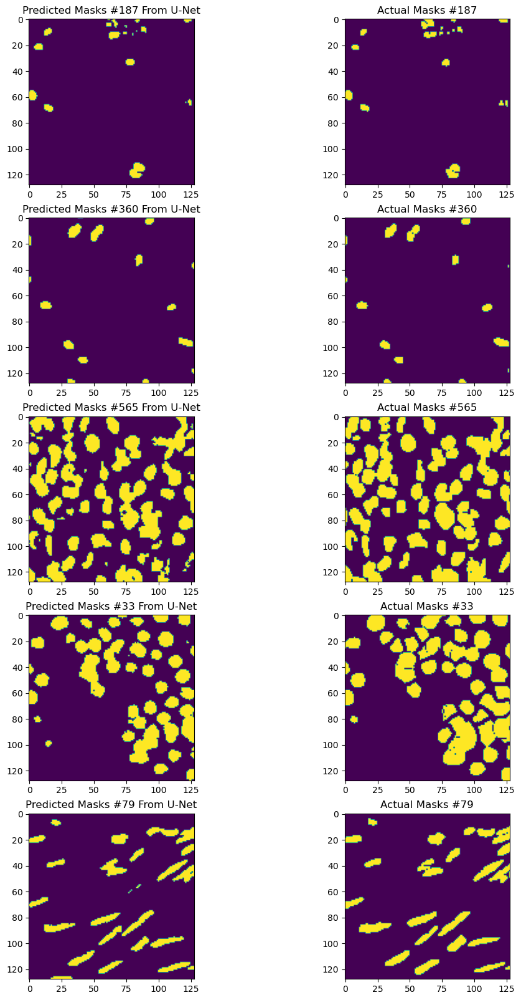

In [111]:
#Display some results from training data
fig , axes = plt.subplots(5,2, figsize=(12,20))
vals = np.random.randint(0,len(preds_train_final_rgb),5)
for idx, i in enumerate(vals):
    axes[idx][0].imshow(preds_train_final_rgb[i])
    axes[idx][0].set_title(f"Predicted Masks #{i} From U-Net")
    axes[idx][1].imshow(y_train_prep_rgb[i])
    axes[idx][1].set_title(f"Actual Masks #{i}")

### Formatting Output Results

In [112]:
# Resize the predicted images
preds_test_resized_rgb = resize_images(preds_test_final_rgb, df_image_test)

In [113]:
# As the image order is not the same in the stage 1 and stage 1 solution, 
# we merge the data to get the same order
df_image_test_w_solution = df_image_test.merge(df_mask, left_on="imageId", right_on="imageid")

In [114]:
preds_test_resized_rgb.shape

(65,)

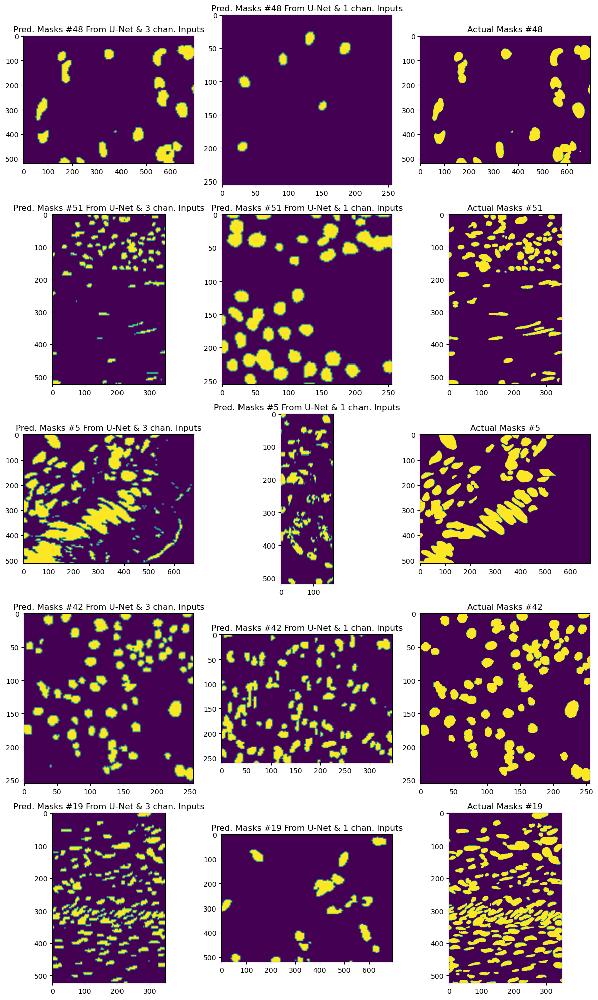

In [115]:
# We plot some results from predicted masks from U-Net model and the actual solution
fig , axes = plt.subplots(5,3, figsize=(12,20))
vals = np.random.randint(0,len(preds_test_resized),5)
for idx, i in enumerate(vals):
    axes[idx][0].imshow(preds_test_resized_rgb[i])
    axes[idx][0].set_title(f"Pred. Masks #{i} From U-Net & 3 chan. Inputs")
    axes[idx][1].imshow(preds_test_resized[i])
    axes[idx][1].set_title(f"Pred. Masks #{i} From U-Net & 1 chan. Inputs")
    axes[idx][2].imshow(df_image_test_w_solution['mask'].loc[i])
    axes[idx][2].set_title(f"Actual Masks #{i}")
plt.tight_layout()
    #print(get_score(np.expand_dims(np.expand_dims(preds_test_resized[vals][idx], axis=2),axis=0),
    #      np.expand_dims(np.expand_dims(df_image_test_w_solution['mask'].iloc[vals].iloc[idx],axis=2),axis=0)))

We do not see much improvement with the 3 channels. The results seem even less accurate than the results with inputs with 1 channel.

### Training on whole available data and predict on Stage 2 Dataset

In [116]:
# We compute the aggregated masks for all the images from stage 1 test
df_mask_resized = pd.DataFrame(columns=['imageid','mask'])
for idx, i in enumerate(np.sort(df_image_test_solution['ImageId'].unique())):
    tmp_list = [i]
    tmp_list.append(get_agg_mask_from_encoded(df_image_test_solution, i, size=(128,128)))
    df_mask_resized.loc[idx] = tmp_list

In [117]:
df_image_test = df_image_test.sort_values(by='imageId')
df_mask_resized = df_mask_resized.sort_values(by='imageid')
x_train_prep_agg_rgb,x_test_prep_agg_rgb, x_test_stage2_prep_agg_rgb, y_train_prep_agg_rgb =  preprocess_data(df_image_train, 
                                                                         df_mask_train, df_image_test, 
                                                                         df_image_test_stage2, 
                                                                         df_mask_test=df_mask_resized,
                    size=(128,128), method=3, inverse=True, grayscale=False, sharp=True, threshold=128)

libpng warning: PLTE: ignored in grayscale PNG


(670, 128, 128, 1)


In [123]:
HEIGHT = 128
WIDTH = 128
DEPTH = 3

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_57 (Conv2D)             (None, 128, 128, 16  448         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_54 (BatchN  (None, 128, 128, 16  64         ['conv2d_57[0][0]']              
 ormalization)                  )                                                           

 activation_62 (Activation)     (None, 8, 8, 256)    0           ['batch_normalization_62[0][0]'] 
                                                                                                  
 conv2d_66 (Conv2D)             (None, 8, 8, 256)    590080      ['activation_62[0][0]']          
                                                                                                  
 batch_normalization_63 (BatchN  (None, 8, 8, 256)   1024        ['conv2d_66[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_63 (Activation)     (None, 8, 8, 256)    0           ['batch_normalization_63[0][0]'] 
                                                                                                  
 conv2d_transpose_12 (Conv2DTra  (None, 16, 16, 128)  131200     ['activation_63[0][0]']          
 nspose)  

                                                                                                  
 conv2d_74 (Conv2D)             (None, 128, 128, 16  2320        ['activation_70[0][0]']          
                                )                                                                 
                                                                                                  
 batch_normalization_71 (BatchN  (None, 128, 128, 16  64         ['conv2d_74[0][0]']              
 ormalization)                  )                                                                 
                                                                                                  
 activation_71 (Activation)     (None, 128, 128, 16  0           ['batch_normalization_71[0][0]'] 
                                )                                                                 
                                                                                                  
 conv2d_75

In [964]:
"""
# If we need to train again the model we can uncomment this cell

model = initialize_u_net_model()
model.summary()

# Fit model
earlystopper = EarlyStopping(patience=5, verbose=1)
#checkpointer = ModelCheckpoint('model-dsbowl2018-u_net_128_3_stage1.h5', verbose=1, save_best_only=True)
results = model_rgb.fit(x_train_prep_rgb, y_train_prep_rgb, validation_split=0.1, batch_size=16, epochs=50, 
                    callbacks=[earlystopper, checkpointer])
                    
"""

Epoch 1/50


2023-04-24 16:12:29.378192: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


42/42 [==============================] - ETA: 0s - loss: 0.3590 - accuracy: 0.9179

2023-04-24 16:12:39.302161: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.



Epoch 1: val_loss improved from inf to 0.50880, saving model to model-dsbowl2018-u_net_128_3_stage1.h5
42/42 [==============================] - 13s 222ms/step - loss: 0.3590 - accuracy: 0.9179 - val_loss: 0.5088 - val_accuracy: 0.9037
Epoch 2/50
42/42 [==============================] - ETA: 0s - loss: 0.2166 - accuracy: 0.9616
Epoch 2: val_loss improved from 0.50880 to 0.34830, saving model to model-dsbowl2018-u_net_128_3_stage1.h5
42/42 [==============================] - 5s 115ms/step - loss: 0.2166 - accuracy: 0.9616 - val_loss: 0.3483 - val_accuracy: 0.9385
Epoch 3/50
42/42 [==============================] - ETA: 0s - loss: 0.1728 - accuracy: 0.9642
Epoch 3: val_loss improved from 0.34830 to 0.25564, saving model to model-dsbowl2018-u_net_128_3_stage1.h5
42/42 [==============================] - 5s 108ms/step - loss: 0.1728 - accuracy: 0.9642 - val_loss: 0.2556 - val_accuracy: 0.9411
Epoch 4/50
41/42 [============================>.] - ETA: 0s - loss: 0.1454 - accuracy: 0.9663
Epoch 

In [124]:
model_rgb = load_model('model-dsbowl2018-u_net_128_3_stage1.h5', compile=False)

In [125]:
# Make Predictions
preds_test_stage2_agg_rgb = model_rgb.predict(x_test_stage2_prep_agg_rgb, verbose=1)

# Rescale Data and transform Them into Integer
preds_test_stage2_agg_rgb = (preds_test_stage2_agg_rgb*255).astype(np.uint8)

# Resize Images
preds_test_stage2_agg_rgb_resized = resize_images(preds_test_stage2_agg_rgb, df_image_test_stage2)

# Threshold to get binary masks
pred_final = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_test_stage2_agg_rgb_resized])

# Run-Length Encode 
df_results_unet = format_output_data_all(df_image_test_stage2, pred_final).sort_values(by='imageId')

# Save Results
df_results_unet.to_csv('res_unet_rgb.csv',index=False)

 1/95 [..............................] - ETA: 27s

2023-05-05 11:22:11.491586: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


95/95 [==============================] - 5s 50ms/step


Score in Private LeaderBoard: **0.37564**

Suprisingly, the results are significantly lower using all the RGB channels

##### Retreating the Outputs

In [127]:
# Taking off too small cells
preds_test_stage2_agg_rgb_resized_retreated = remove_too_small_cells(pred_final, threshold=0.03)

df_results_unet_rgb_wo_small = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_rgb_resized_retreated).sort_values(by='imageId')

df_results_unet_rgb_wo_small.to_csv('res_unet_rgb_wo_small.csv',index=False)


Score in Private LeaderBoard: **0.4293**

In [128]:
# Splitting Cells
preds = np.array([np.expand_dims(xi,axis=2) for xi in pred_final])

preds_test_stage2_agg_rgb_resized_splitted = np.array(list(map(split_touching_cells, preds)))

df_results_unet_rgb_splitted = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_rgb_resized_splitted).sort_values(by='imageId')


df_results_unet_rgb_splitted.to_csv('res_unet_rgb_splitted.csv',index=False)


Score in Private LeaderBoard: **0.37916**

In [129]:
# Combining both retreatment
preds_test_stage2_agg_rgb_resized_retreated_splitted = remove_too_small_cells(pred_final, threshold=0.03)


preds_splitted = np.array([np.expand_dims(xi,axis=2) for xi in preds_test_stage2_agg_rgb_resized_retreated_splitted])


preds_test_stage2_agg_rgb_resized_retreated_splitted = np.array(list(map(split_touching_cells, preds_splitted)))

df_results_unet_rgb_retreated_splitted = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_rgb_resized_retreated_splitted).sort_values(by='imageId')


df_results_unet_rgb_retreated_splitted.to_csv('res_unet_rgb_retreated_splitted.csv',index=False)


Score in Private LeaderBoard: **0.42081**

## U-Net x 256*256 & 1 Channel

Another possibility to improve our model is to use a greater shape for the inputs & outputs. Let see what is the impact of that.

In [145]:
# We compute the aggregated masks for all the images from stage 1 test
df_mask_resized = pd.DataFrame(columns=['imageid','mask'])
for idx, i in enumerate(np.sort(df_image_test_solution['ImageId'].unique())):
    tmp_list = [i]
    tmp_list.append(get_agg_mask_from_encoded(df_image_test_solution, i, size=(256,256)))
    df_mask_resized.loc[idx] = tmp_list

df_image_test = df_image_test.sort_values(by='imageId')
df_mask_resized = df_mask_resized.sort_values(by='imageid')
x_train_prep_agg_256,x_test_prep_agg_256, x_test_stage2_prep_agg_256, y_train_prep_agg_256 =  preprocess_data(df_image_train, 
                                                                         df_mask_train, df_image_test, 
                                                                         df_image_test_stage2, 
                                                                         df_mask_test=df_mask_resized,
                    size=(256,256), method=3, inverse=True, grayscale=True, sharp=True, threshold=128)

HEIGHT = 256
WIDTH = 256
DEPTH = 1

libpng warning: PLTE: ignored in grayscale PNG


(670, 256, 256, 1)


In [974]:
"""
# If we need to train again the model we can uncomment this cell

model_256 = initialize_u_net_model()
model_256.summary()

# Fit model
earlystopper = EarlyStopping(patience=5, verbose=1)
#checkpointer = ModelCheckpoint('model-dsbowl2018-u_net_256_1_stage1.h5', verbose=1, save_best_only=True)
results_256 = model_256.fit(x_train_prep_agg_256, y_train_prep_agg_256, validation_split=0.1, batch_size=16, epochs=50, 
                    callbacks=[earlystopper, checkpointer])
                    
"""

Epoch 1/50


2023-04-24 16:46:49.607987: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


42/42 [==============================] - ETA: 0s - loss: 0.3386 - accuracy: 0.9307

2023-04-24 16:47:10.275077: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.



Epoch 1: val_loss improved from inf to 0.48842, saving model to model-dsbowl2018-u_net_256_1_stage1.h5
42/42 [==============================] - 24s 461ms/step - loss: 0.3386 - accuracy: 0.9307 - val_loss: 0.4884 - val_accuracy: 0.9364
Epoch 2/50
42/42 [==============================] - ETA: 0s - loss: 0.2093 - accuracy: 0.9602
Epoch 2: val_loss improved from 0.48842 to 0.34244, saving model to model-dsbowl2018-u_net_256_1_stage1.h5
42/42 [==============================] - 15s 364ms/step - loss: 0.2093 - accuracy: 0.9602 - val_loss: 0.3424 - val_accuracy: 0.9154
Epoch 3/50
42/42 [==============================] - ETA: 0s - loss: 0.1743 - accuracy: 0.9605
Epoch 3: val_loss improved from 0.34244 to 0.31270, saving model to model-dsbowl2018-u_net_256_1_stage1.h5
42/42 [==============================] - 15s 359ms/step - loss: 0.1743 - accuracy: 0.9605 - val_loss: 0.3127 - val_accuracy: 0.9294
Epoch 4/50
42/42 [==============================] - ETA: 0s - loss: 0.1477 - accuracy: 0.9634
Epoc

In [143]:
# Load Trained Model
model_256 = load_model('model-dsbowl2018-u_net_256_1_stage1.h5')

In [146]:
# Make Predictions
preds_test_stage2_agg_256 = model_256.predict(x_test_stage2_prep_agg_256, verbose=1)

# Rescale Data and transform Them into Integer
preds_test_stage2_agg_256 = (preds_test_stage2_agg_256*255).astype(np.uint8)

# Resize Images
preds_test_stage2_agg_256_resized = resize_images(preds_test_stage2_agg_256, df_image_test_stage2)

# Threshold to get binary masks
pred_final = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_test_stage2_agg_256_resized])

# Run-Length Encode 
df_results_unet = format_output_data_all(df_image_test_stage2, pred_final).sort_values(by='imageId')

# Save Results
df_results_unet.to_csv('res_unet_256.csv',index=False)

95/95 [==============================] - 41s 432ms/step


Score in Private LeaderBoard: **0.39625**

Suprisingly, the results are not better with a greater shape.

In [147]:
# Taking off too small cells
preds_test_stage2_agg_256_resized_retreated = remove_too_small_cells(pred_final, threshold=0.03)

df_results_unet_256_wo_small = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_256_resized_retreated).sort_values(by='imageId')

df_results_unet_256_wo_small.to_csv('res_unet_256_wo_small.csv',index=False)


Score in Private LeaderBoard: **0.43418**

In [134]:
# Splitting Cells
preds = np.array([np.expand_dims(xi,axis=2) for xi in preds_test_stage2_agg_256_resized])

preds_test_stage2_agg_256_resized_splitted = np.array(list(map(split_touching_cells, preds)))

df_results_unet_256_splitted = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_256_resized_splitted).sort_values(by='imageId')


df_results_unet_256_splitted.to_csv('res_unet_256_splitted.csv',index=False)


Score in Private LeaderBoard: **0.3309**

In [135]:
# Combining both retreatment
preds_test_stage2_agg_256_resized_retreated_splitted = remove_too_small_cells(preds_test_stage2_agg_256_resized, threshold=0.03)


preds_splitted = np.array([np.expand_dims(xi,axis=2) for xi in preds_test_stage2_agg_256_resized_retreated_splitted])


preds_test_stage2_agg_256_resized_retreated_splitted = np.array(list(map(split_touching_cells, preds_splitted)))

df_results_unet_256_retreated_splitted = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_256_resized_retreated_splitted).sort_values(by='imageId')


df_results_unet_256_retreated_splitted.to_csv('res_unet_256_retreated_splitted.csv',index=False)


KeyboardInterrupt: 

Score in Private LeaderBoard: **0.35597**

# Post Processing

## Watershed

Watershed is a technic to split touching elements during segmentation. This can be very useful in our case. 

### Presentation

Let see how watershed works with this simple example.

In [125]:
import numpy as np
import cv2 as cv
img = cv.imread('coins.jpg')
assert img is not None, "file could not be read, check with os.path.exists()"
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)

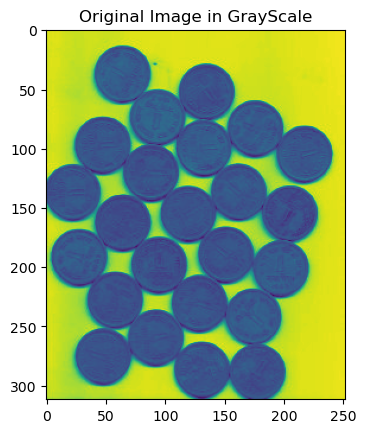

In [126]:
fig, axes = plt.subplots(1)
axes.imshow(gray);
axes.set_title('Original Image in GrayScale');

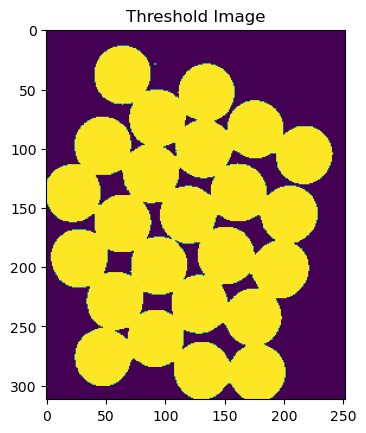

In [127]:
fig, axes = plt.subplots(1)
axes.imshow(thresh);
axes.set_title('Threshold Image');

In [128]:
# noise removal
kernel = np.ones((3,3),np.uint8)
opening = cv.morphologyEx(thresh,cv.MORPH_OPEN,kernel, iterations = 2)
# sure background area
sure_bg = cv.dilate(opening,kernel,iterations=3)
# Finding sure foreground area
dist_transform = cv.distanceTransform(opening,cv.DIST_L2,5)
ret, sure_fg = cv.threshold(dist_transform,0.7*dist_transform.max(),255,0)
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg,sure_fg)

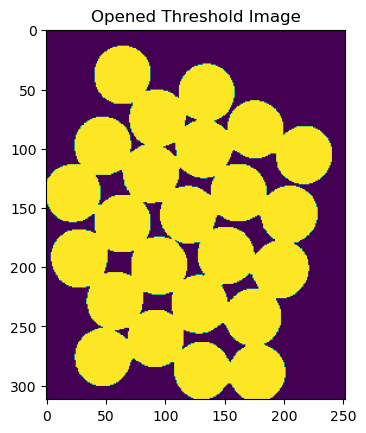

In [131]:
fig, axes = plt.subplots(1)
axes.imshow(opening);
axes.set_title('Opened Threshold Image');

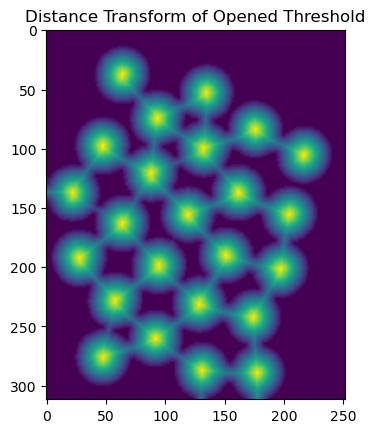

In [132]:
fig, axes = plt.subplots(1)
axes.imshow(dist_transform);
axes.set_title('Distance Transform of Opened Threshold');

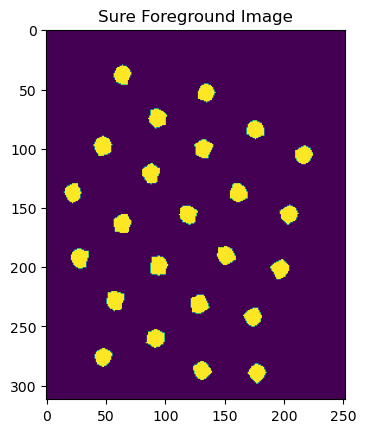

In [134]:
fig, axes = plt.subplots(1)
axes.imshow(sure_fg);
axes.set_title('Sure Foreground Image');

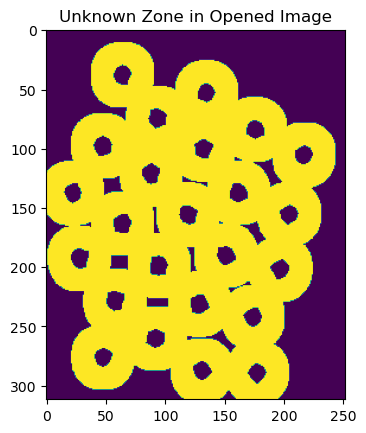

In [135]:
fig, axes = plt.subplots(1)
axes.imshow(unknown);
axes.set_title('Unknown Zone in Opened Image');

In [136]:
# Marker labelling
ret, markers = cv.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# Now, mark the region of unknown with zero
markers[unknown==255] = 0

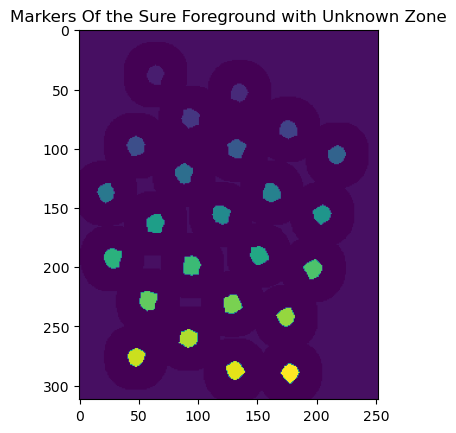

In [137]:
fig, axes = plt.subplots(1)
axes.imshow(markers);
axes.set_title('Markers Of the Sure Foreground with Unknown Zone');

In [138]:
markers = cv.watershed(img,markers)
img[markers == -1] = [255,0,0]

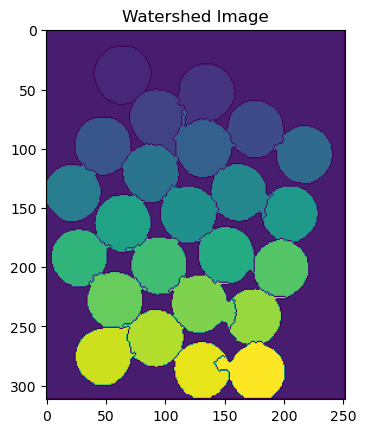

In [139]:
fig, axes = plt.subplots(1)
axes.imshow(markers);
axes.set_title('Watershed Image');

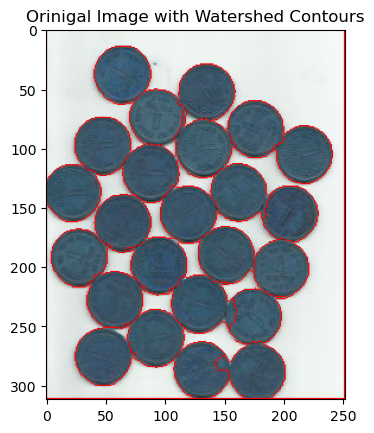

In [140]:
fig, axes = plt.subplots(1)
axes.imshow(img);
axes.set_title('Orinigal Image with Watershed Contours');

### Implementation & Results

In [160]:
def watershed_transform(mask, kernel_size=(3,3), opening_iteration=2, 
                        dilating_iteration=2, threshold=0.4):
    """
    inputs: array image having values 0 and 1
    outputs: marker => array with labelled nucleus
    """
    img = np.uint8(mask*255).copy()
    img_rgb = cv.cvtColor(img, cv.COLOR_GRAY2BGR)
    
    # noise removal
    kernel = np.ones(kernel_size,np.uint8)
    opening = cv.morphologyEx(img,cv.MORPH_OPEN,kernel, iterations = opening_iteration)
    # sure background area
    sure_bg = cv.dilate(opening,kernel,iterations=dilating_iteration)
    # Finding sure foreground area
    dist_transform = cv.distanceTransform(opening,cv.DIST_L2,5)
    ret, sure_fg = cv.threshold(dist_transform,threshold*dist_transform.max(),255,0)
    # Finding unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = cv.subtract(sure_bg,sure_fg)
    
    # Marker labelling
    ret, markers = cv.connectedComponents(sure_fg)
    # Add one to all labels so that sure background is not 0, but 1
    markers = markers+1
    # Now, mark the region of unknown with zero
    markers[unknown==255] = 0
    
    markers = cv.watershed(img_rgb,markers)
    markers[markers==-1]=0
    markers[markers>0]-=1
    
    return markers


def watershed_transform_all(images, kernel_size=(3,3), opening_iteration=2, 
                        dilating_iteration=2, threshold=0.4):

    preds_test_watershed = []
    for i in range(0, len(images)):
        preds_test_watershed.append(watershed_transform(images[i],kernel_size=kernel_size,
                                                       opening_iteration=opening_iteration,
                                                       dilating_iteration=dilating_iteration,
                                                       threshold=threshold))
    return np.array(preds_test_watershed)


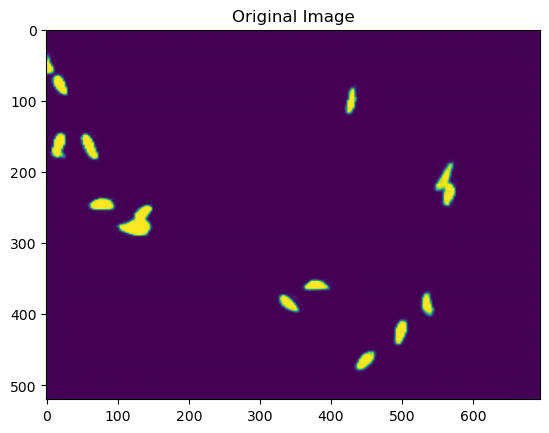

In [177]:
fig, axes = plt.subplots(1);
axes.imshow(preds_test_stage2_agg_256_resized[0]);
axes.set_title('Original Image');

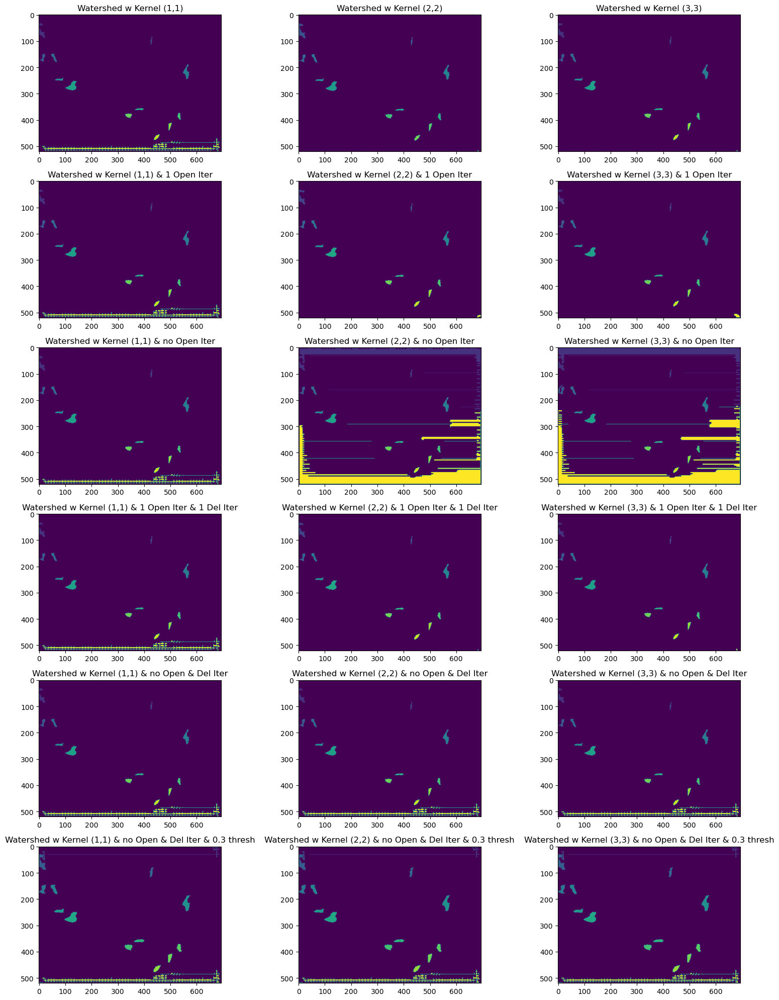

In [178]:
fig, axes = plt.subplots(6,3, figsize=(16,20));
axes[0][0].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(1,1)))
axes[0][0].set_title('Watershed w Kernel (1,1)')
axes[0][1].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(2,2)))
axes[0][1].set_title('Watershed w Kernel (2,2)')
axes[0][2].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(3,3)))
axes[0][2].set_title('Watershed w Kernel (3,3)')
axes[1][0].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(1,1), opening_iteration=1))
axes[1][0].set_title('Watershed w Kernel (1,1) & 1 Open Iter')
axes[1][1].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(2,2), opening_iteration=1))
axes[1][1].set_title('Watershed w Kernel (2,2) & 1 Open Iter')
axes[1][2].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(3,3), opening_iteration=1))
axes[1][2].set_title('Watershed w Kernel (3,3) & 1 Open Iter')
axes[2][0].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(1,1), opening_iteration=0))
axes[2][0].set_title('Watershed w Kernel (1,1) & no Open Iter')
axes[2][1].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(2,2), opening_iteration=0))
axes[2][1].set_title('Watershed w Kernel (2,2) & no Open Iter')
axes[2][2].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(3,3), opening_iteration=0))
axes[2][2].set_title('Watershed w Kernel (3,3) & no Open Iter')
axes[3][0].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(1,1), opening_iteration=1, dilating_iteration=1))
axes[3][0].set_title('Watershed w Kernel (1,1) & 1 Open Iter & 1 Del Iter')
axes[3][1].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(2,2), opening_iteration=1, dilating_iteration=1))
axes[3][1].set_title('Watershed w Kernel (2,2) & 1 Open Iter & 1 Del Iter')
axes[3][2].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(3,3), opening_iteration=1, dilating_iteration=1))
axes[3][2].set_title('Watershed w Kernel (3,3) & 1 Open Iter & 1 Del Iter')
axes[4][0].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(1,1), opening_iteration=0, dilating_iteration=0))
axes[4][0].set_title('Watershed w Kernel (1,1) & no Open & Del Iter')
axes[4][1].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(2,2), opening_iteration=0, dilating_iteration=0))
axes[4][1].set_title('Watershed w Kernel (2,2) & no Open & Del Iter')
axes[4][2].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(3,3), opening_iteration=0, dilating_iteration=0))
axes[4][2].set_title('Watershed w Kernel (3,3) & no Open & Del Iter')
axes[5][0].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(1,1), threshold=0.3, opening_iteration=0, dilating_iteration=0))
axes[5][0].set_title('Watershed w Kernel (1,1) & no Open & Del Iter & 0.3 thresh')
axes[5][1].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(2,2), threshold=0.3, opening_iteration=0, dilating_iteration=0))
axes[5][1].set_title('Watershed w Kernel (2,2) & no Open & Del Iter & 0.3 thresh')
axes[5][2].imshow(watershed_transform(preds_test_stage2_agg_256_resized[0], kernel_size=(3,3), threshold=0.3, opening_iteration=0, dilating_iteration=0))
axes[5][2].set_title('Watershed w Kernel (3,3) & no Open & Del Iter & 0.3 thresh')
plt.tight_layout()

In [163]:
def format_result_one_mask(mask, imageId, height=128, width=128):

    """ Format output results in the form of a DataFrame and run_length encoding
    inputs: 
        mask: array of mask with segmented nucleus, shape (height, width, 1)
        imageId: string of the imageId
    """
    
    res_list = []
    y_train_lab = mask.reshape(mask.shape[0],mask.shape[1])
    list_lab = list(np.unique(mask))
    list_lab.remove(0)
    df = pd.DataFrame([imageId]*len(list_lab),columns=['imageId'])
    for i in list_lab:
        l = np.where(mask.transpose().reshape(mask.shape[0]*mask.shape[1]) == i)[0]
        res = generate_data_submission(l)
        res_list.append(res)
    rank = np.argsort([val[0] for val in res_list])
    df['EncodedPixels'] = np.array([" ".join([str(s) for s in l]) for l in res_list])[rank]
    return df


def format_output_data_all_masks(df_x, mask):
    df_final = pd.DataFrame(columns=['imageId','EncodedPixels'])
    for i in range(0, len(df_x)):
        df_final = pd.concat([df_final,format_result_one_mask(mask[i],df_x['imageId'].iloc[i], 
                                                               df_x['height'].iloc[i], df_x['width'].iloc[i])])
    return df_final


In [1490]:
mask_test_stage2_agg_resized_retreated_watershed = watershed_transform_all(preds_test_stage2_agg_resized_retreated, threshold=0.05, kernel_size=(1,1))

df_results_unet_wo_small_watershed = format_output_data_all_masks(df_image_test_stage2, mask_test_stage2_agg_resized_retreated_watershed).sort_values(by='imageId')

df_results_unet_wo_small_watershed.to_csv('res_unet_wo_small_watershed.csv',index=False)


Score in Private Leaderboard: **0.4587**

We do not have an improvement with that technic but still have some reasonnable results

# Data Augmentation

## Test Time Augmentation

The idea of this part is "to create a data augmentation during the test time".
The global idea is: for each image to predict:
- We create several augmented images (flip vertically, horizontally, both, rotation, distortion, etc.)
- We predict each of these augmented images (+ original image)
- We apply, the inverse operation to get the prediction of the original image 
- We mean the X different predictions

Overall, the prediction should be improved.

In [136]:
model = load_model("model-dsbowl2018-u_net_128_1_stage1.h5", compile=False)

In [137]:
#Now that we know the transformations are working, let us extend to all predictions
predictions = []
for image in x_test_stage2_prep_agg:
    
    pred_original = model.predict(np.expand_dims(image, axis=0))[0][:, :, 0]
    
    pred_lr = model.predict(np.expand_dims(np.fliplr(image), axis=0))[0][:, :, 0]
    pred_lr = np.fliplr(pred_lr)
    
    pred_ud = model.predict(np.expand_dims(np.flipud(image), axis=0))[0][:, :, 0]
    pred_ud = np.flipud(pred_ud)
    
    pred_lr_ud = model.predict(np.expand_dims(np.fliplr(np.flipud(image)), axis=0))[0][:, :, 0]
    pred_lr_ud = np.fliplr(np.flipud(pred_lr_ud))
    
    pred_transp = model.predict(np.expand_dims(np.transpose(image, axes=(1,0,2)),axis=0))[0][:, :, 0]
    pred_transp = np.transpose(pred_transp)
    
    pred_transp_ud = model.predict(np.expand_dims(np.transpose(np.flipud(image), axes=(1,0,2)),axis=0))[0][:, :, 0]
    pred_transp_ud = np.flipud(np.transpose(pred_transp_ud))
    
    pred_transp_lr = model.predict(np.expand_dims(np.transpose(np.fliplr(image), axes=(1,0,2)),axis=0))[0][:, :, 0]
    pred_transp_lr = np.fliplr(np.transpose(pred_transp_lr))
    
    pred_transp_lr_ud = model.predict(np.expand_dims(np.transpose(np.fliplr(np.flipud(image)), axes=(1,0,2)),axis=0))[0][:, :, 0]
    pred_transp_lr_ud = np.fliplr(np.flipud(np.transpose(pred_transp_lr_ud)))
    
    preds = (pred_original + pred_lr + pred_ud + pred_lr_ud +
            pred_transp + pred_transp_ud + pred_transp_lr + pred_transp_lr_ud) / 8
    
    predictions.append(preds)

2023-05-05 14:14:59.947297: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


In [138]:
# Put in Array Type 
predictions = np.array(predictions)

# Rescale Data and transform Them into Integer
preds_test_stage2_agg_taug = (predictions*255).astype(np.uint8)

# Resize Images
preds_test_stage2_agg_taug_resized = resize_images(preds_test_stage2_agg_taug, df_image_test_stage2)

# Threshold to get binary masks
pred_final = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_test_stage2_agg_taug_resized])

# Run-Length Encode 
df_results_unet = format_output_data_all(df_image_test_stage2, pred_final).sort_values(by='imageId')

# Save Results
df_results_unet.to_csv('res_unet_test_aug.csv',index=False)

Score on Private Leaderboard: **0.46116**

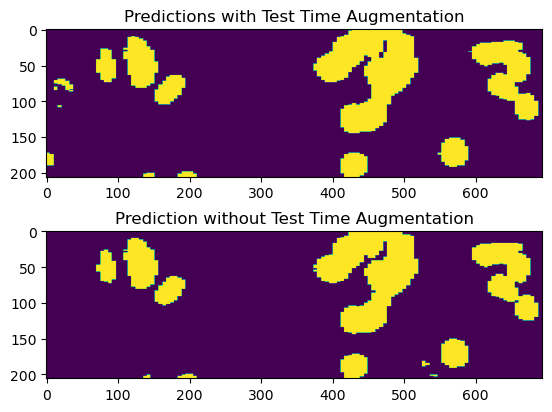

In [1573]:
fig, axes = plt.subplots(2)
axes[0].imshow(preds_test_stage2_agg_taug_resized[3])
axes[0].set_title('Predictions with Test Time Augmentation');
axes[1].imshow(preds_test_stage2_agg_resized[3])
axes[1].set_title('Prediction without Test Time Augmentation');

In [139]:
# Test Time Augmentation & Removing 
preds_test_stage2_agg_taug_resized_retreated = remove_too_small_cells(pred_final, threshold=0.03)

df_results_unet_wo_small_test_aug = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_taug_resized_retreated).sort_values(by='imageId')

df_results_unet_wo_small_test_aug.to_csv('res_unet_wo_small_test_aug.csv',index=False)


Score on Private Leaderborad: **0.50366**

In [141]:
preds_test_stage2_agg_test_aug_resized_retreated_splitted = preds_test_stage2_agg_taug_resized_retreated.copy()

preds_splitted = np.array([np.expand_dims(xi,axis=2) for xi in preds_test_stage2_agg_test_aug_resized_retreated_splitted])

preds_test_stage2_agg_test_aug_resized_retreated_splitted = np.array(list(map(split_touching_cells, preds_splitted)))

df_results_unet_test_aug_retreated_splitted = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_test_aug_resized_retreated_splitted).sort_values(by='imageId')

df_results_unet_test_aug_retreated_splitted.to_csv('res_unet_test_aug_retreated_splitted.csv',index=False)


Score on Private LeaderBoord: **0.47249**

We get some better and consistent results with this technic

## Data Augmentation

Another technic that can be used to improve models is to create artificial images based on existing ones in the train set to grow the train set size. This is particularly useful when you do not have much data for the training part.

The goal is to create augmentations that are different from train set but actually possible to see(for example: flip horizontally an image of a horse is okay but flip vertically is not relevant as you do not see horses like this in real life). 

In [179]:
"""
Relevant augmentations for that task

Clahe, Sharpen, Emboss
Gaussian Noise
Color to Gray
Remapping grayscale images to random color images
Blur, Median Blur, Motion Blur
contrast and brightness
random scale, rotates and flips
Heavy geometric transformations: Elastic Transform, Perspective
Transform, Piecewise Affine transforms, pincushion distortion
Random HSV
"""

'\nRelevant augmentations for that task\n\nClahe, Sharpen, Emboss\nGaussian Noise\nColor to Gray\nRemapping grayscale images to random color images\nBlur, Median Blur, Motion Blur\ncontrast and brightness\nrandom scale, rotates and flips\nHeavy geometric transformations: Elastic Transform, Perspective\nTransform, Piecewise Affine transforms, pincushion distortion\nRandom HSV\n'

In [177]:
import albumentations as A

transform = A.Compose([
    A.RandomCrop(width=92, height=92, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Transpose(p=0.5),
    A.Rotate(p=0.7, limit=90)
    
])


def aug_fn(image, mask, img_size, transform):
    data = {"image":image, "mask": mask}
    aug_data = transform(**data)
    aug_img = aug_data["image"]
    aug_mask = aug_data["mask"]
    aug_img = tf.image.resize(aug_img, size=[img_size, img_size])
    aug_mask = tf.image.resize(aug_mask, size=[img_size, img_size])
    return aug_img, aug_mask


In [173]:
aug_img = []
aug_mask = []
for img, mask in zip(x_train_prep_agg.astype(np.float32), y_train_prep_agg.astype(np.float32)):
    # number of augmented images per image
    for i in range(4): 
        res_im, res_mask = aug_fn(img, mask, 128, transform)
        aug_img.append(res_im)
        aug_mask.append(res_mask)
aug_img = np.array(aug_img).astype(np.float64)
aug_mask = np.array(aug_mask)

KeyboardInterrupt: 

In [154]:
# Add augmented images and masks to train set
x_train_prep_agg_w_aug = np.concatenate((x_train_prep_agg,aug_img),axis=0)
y_train_prep_agg_w_aug = np.concatenate((y_train_prep_agg,aug_mask),axis=0)

In [155]:
HEIGHT = 128
WIDTH = 128
DEPTH = 1

In [156]:
"""
# If we need to train again the model we can uncomment this cell

model = initialize_u_net_model()

# Fit model
earlystopper = EarlyStopping(patience=5, verbose=1)
checkpointer = ModelCheckpoint('model-dsbowl2018-u_net_128_1_stage1_aug.h5', verbose=1, save_best_only=True)
results = model.fit(x_train_prep_agg_w_aug, y_train_prep_agg_w_aug, validation_split=0.1, batch_size=16, epochs=50, 
                    callbacks=[earlystopper, checkpointer])
                    
"""

Epoch 1/50


2023-05-05 15:19:01.409609: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


207/207 [==============================] - ETA: 0s - loss: 0.2216 - accuracy: 0.9286

2023-05-05 15:19:39.464122: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.



Epoch 1: val_loss improved from inf to 0.20990, saving model to model-dsbowl2018-u_net_128_1_stage1_aug.h5
207/207 [==============================] - 42s 186ms/step - loss: 0.2216 - accuracy: 0.9286 - val_loss: 0.2099 - val_accuracy: 0.8966
Epoch 2/50
207/207 [==============================] - ETA: 0s - loss: 0.1251 - accuracy: 0.9380
Epoch 2: val_loss improved from 0.20990 to 0.17836, saving model to model-dsbowl2018-u_net_128_1_stage1_aug.h5
207/207 [==============================] - 34s 163ms/step - loss: 0.1251 - accuracy: 0.9380 - val_loss: 0.1784 - val_accuracy: 0.9006
Epoch 3/50
207/207 [==============================] - ETA: 0s - loss: 0.1099 - accuracy: 0.9385
Epoch 3: val_loss improved from 0.17836 to 0.15748, saving model to model-dsbowl2018-u_net_128_1_stage1_aug.h5
207/207 [==============================] - 20s 95ms/step - loss: 0.1099 - accuracy: 0.9385 - val_loss: 0.1575 - val_accuracy: 0.9042
Epoch 4/50
207/207 [==============================] - ETA: 0s - loss: 0.1022 

In [150]:
# load trained model
model = load_model('model-dsbowl2018-u_net_128_1_stage1_aug.h5')

In [157]:
# Make Predictions
preds_test_stage2_agg = model.predict(x_test_stage2_prep_agg, verbose=1)

# Rescale Data and transform Them into Integer
preds_test_stage2_agg = (preds_test_stage2_agg*255).astype(np.uint8)

# Resize Images
preds_test_stage2_agg_resized = resize_images(preds_test_stage2_agg, df_image_test_stage2)

# Threshold to get binary masks
pred_final = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_test_stage2_agg_resized])

# Run-Length Encode 
df_results_unet = format_output_data_all(df_image_test_stage2, pred_final).sort_values(by='imageId')

# Save Results
df_results_unet.to_csv('res_unet_aug.csv',index=False)

2023-05-05 15:25:17.608886: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


95/95 [==============================] - 5s 54ms/step


Score in Private LeaderBoard: **0.40449**

We don not have better results. This is probably due to the fact that we need to spend more time in optimizing what augmentations are useful and at which probability.

## Combining Both

In [158]:
# Load train model
model = load_model('model-dsbowl2018-u_net_128_1_stage1_aug.h5', compile=False)

In [159]:
#Now that we know the transformations are working, let us extend to all predictions
predictions = []
for image in x_test_stage2_prep_agg:
    
    pred_original = model.predict(np.expand_dims(image, axis=0))[0][:, :, 0]
    
    pred_lr = model.predict(np.expand_dims(np.fliplr(image), axis=0))[0][:, :, 0]
    pred_lr = np.fliplr(pred_lr)
    
    pred_ud = model.predict(np.expand_dims(np.flipud(image), axis=0))[0][:, :, 0]
    pred_ud = np.flipud(pred_ud)
    
    pred_lr_ud = model.predict(np.expand_dims(np.fliplr(np.flipud(image)), axis=0))[0][:, :, 0]
    pred_lr_ud = np.fliplr(np.flipud(pred_lr_ud))
    
    pred_transp = model.predict(np.expand_dims(np.transpose(image, axes=(1,0,2)),axis=0))[0][:, :, 0]
    pred_transp = np.transpose(pred_transp)
    
    pred_transp_ud = model.predict(np.expand_dims(np.transpose(np.flipud(image), axes=(1,0,2)),axis=0))[0][:, :, 0]
    pred_transp_ud = np.flipud(np.transpose(pred_transp_ud))
    
    pred_transp_lr = model.predict(np.expand_dims(np.transpose(np.fliplr(image), axes=(1,0,2)),axis=0))[0][:, :, 0]
    pred_transp_lr = np.fliplr(np.transpose(pred_transp_lr))
    
    pred_transp_lr_ud = model.predict(np.expand_dims(np.transpose(np.fliplr(np.flipud(image)), axes=(1,0,2)),axis=0))[0][:, :, 0]
    pred_transp_lr_ud = np.fliplr(np.flipud(np.transpose(pred_transp_lr_ud)))
    
    preds = (pred_original + pred_lr + pred_ud + pred_lr_ud +
            pred_transp + pred_transp_ud + pred_transp_lr + pred_transp_lr_ud) / 8
    
    predictions.append(preds)

2023-05-05 15:30:38.523354: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 9ms/step


In [160]:
# Data Augmentation + Test Time Augmentation

# Put in Array Type 
predictions = np.array(predictions)

# Rescale Data and transform Them into Integer
preds_test_stage2_agg_taug = (predictions*255).astype(np.uint8)

# Resize Images
preds_test_stage2_agg_taug_resized = resize_images(preds_test_stage2_agg_taug, df_image_test_stage2)

# Threshold to get binary masks
pred_final = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_test_stage2_agg_taug_resized])

# Run-Length Encode 
df_results_unet = format_output_data_all(df_image_test_stage2, pred_final).sort_values(by='imageId')

# Save Results
df_results_unet.to_csv('res_unet_test_aug_aug.csv',index=False)

Score in Private LeaderBoard: **0.45661**

In [161]:
# Data Augmentation + Test Time Augmentation & Removing Too Small Cells
preds_test_stage2_agg_aug_test_aug_resized_retreated = remove_too_small_cells(pred_final, threshold=0.03)

df_results_unet_wo_small_aug_test_aug = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_aug_test_aug_resized_retreated).sort_values(by='imageId')

df_results_unet_wo_small_aug_test_aug.to_csv('res_unet_wo_small_aug_test_aug.csv',index=False)


Score in Private LeaderBoard: **0.49621**

In [162]:
# Data Augmentation + Test Time Augmentation + Splitting & Removing Too Small Cells
preds_test_stage2_agg_aug_test_aug_resized_retreated_splitted = preds_test_stage2_agg_aug_test_aug_resized_retreated.copy()

preds_splitted = np.array([np.expand_dims(xi,axis=2) for xi in preds_test_stage2_agg_aug_test_aug_resized_retreated_splitted])

preds_test_stage2_agg_aug_test_aug_resized_retreated_splitted = np.array(list(map(split_touching_cells, preds_splitted)))

df_results_unet_aug_test_aug_retreated_splitted = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_aug_test_aug_resized_retreated_splitted).sort_values(by='imageId')

df_results_unet_aug_test_aug_retreated_splitted.to_csv('res_unet_aug_test_aug_retreated_splitted.csv',index=False)


Score in Private LeaderBoard: **0.47626**

# Transfer Learning

Transfer Learning is the use of pre-trained models that have been used for another task to jump start the development process on a new task or problem.

This has been proven to be efficient on some tasks. Hence, let's try this technic and see if we can have an uplift in terms of performance.

## VGG16

One very important deep leraning model in computer vision is te VGG16 architecture.
It demonstrates some good results in numerous tasks. Let's use it in our case.

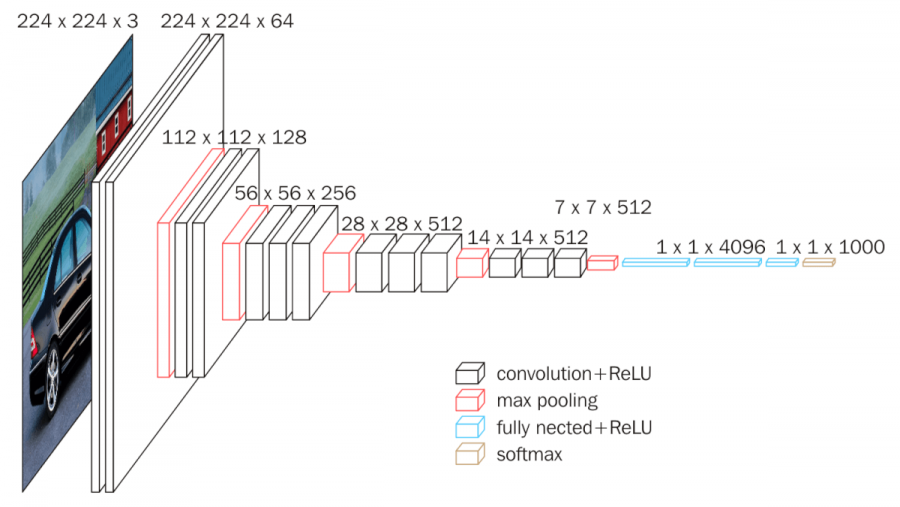

In [86]:
df_image_test = df_image_test.sort_values(by='imageId')
df_mask_resized = df_mask_resized.sort_values(by='imageid')
x_train_prep_agg_rgb, x_test_prep_agg_rgb, x_test_stage2_prep_agg_rgb, y_train_prep_agg_rgb =  preprocess_data(df_image_train, 
                                                                         df_mask_train, df_image_test, 
                                                                         df_image_test_stage2, 
                                                                         df_mask_test=df_mask_resized,
                    size=(128,128), method=3, inverse=True, grayscale=False, sharp=True, threshold=128)

libpng warning: PLTE: ignored in grayscale PNG


(670, 128, 128, 1)
(670, 128, 128, 1)


In [99]:
# Load vgg model
input_shape = x_train_prep_agg_rgb.shape[1:]
vgg16 = tf.keras.applications.VGG16(include_top=False,weights="imagenet", input_shape=input_shape)

58889256/58889256 [==============================] - 2s 0us/step


In [100]:
vgg16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0     

In [146]:
def initialize_u_net_model_vgg(loss = 'binary_crossentropy'):
    
    input_layer = Input(shape=(HEIGHT, WIDTH, DEPTH), dtype=tf.float16)
    
    vgg16 = tf.keras.applications.VGG16(include_top=False,weights="imagenet", input_shape=input_shape)
    last_layer_vgg = vgg16.output
    input_layer = vgg16.input

    
    #first we freeze all the vgg16 layers
    vgg16.trainable = False
    
    u1 = Conv2DTranspose(256,(3,3),strides=(2, 2), padding="same")(last_layer_vgg)
    c1 = layers.concatenate([u1, vgg16.get_layer("block5_conv3").output])
    c1 = layers.Conv2D(256,(3,3), padding="same")(c1)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.Activation("relu")(c1)
    c1 = layers.Conv2D(256,(3,3),padding="same")(c1)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.Activation("relu")(c1)
    

    u2 = layers.Conv2DTranspose(128,(2,2),strides=(2,2),padding="same")(c1)
    c2 = layers.concatenate([u2, vgg16.get_layer("block4_conv3").output])
    c2 = layers.Conv2D(128,(3,3), padding="same")(c2)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.Activation("relu")(c2)
    c2 = layers.Conv2D(128,(3,3),padding="same")(c2)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.Activation("relu")(c2)

    
    u3 = layers.Conv2DTranspose(64,(2,2),strides=(2,2),padding="same")(c2)
    c3 = layers.concatenate([u3,vgg16.get_layer("block3_conv3").output])
    c3 = layers.Conv2D(64,(3,3), padding="same")(c3)
    c3 = layers.BatchNormalization()(c3)
    c3 = layers.Activation("relu")(c3)
    c3 = layers.Conv2D(64,(3,3),padding="same")(c3)
    c3 = layers.BatchNormalization()(c3)
    c3 = layers.Activation("relu")(c3)


    u4 = layers.Conv2DTranspose(16,(2,2),strides=(2,2),padding="same")(c3)
    c4 = layers.concatenate([u4,vgg16.get_layer("block2_conv2").output])
    c4 = layers.Conv2D(16,(3,3), padding="same")(c4)
    c4 = layers.BatchNormalization()(c4)
    c4 = layers.Activation("relu")(c4)
    c4 = layers.Conv2D(16,(3,3),padding="same")(c4)
    c4 = layers.BatchNormalization()(c4)
    c4 = layers.Activation("relu")(c4)
    
    u5 = layers.Conv2DTranspose(16,(2,2),strides=(2,2),padding="same")(c4)
    c5 = layers.concatenate([u5,vgg16.get_layer("block1_conv2").output])
    c5 = layers.Conv2D(16,(3,3), padding="same")(c5)
    c5 = layers.BatchNormalization()(c5)
    c5 = layers.Activation("relu")(c5)
    c5 = layers.Conv2D(16,(3,3),padding="same")(c5)
    c5 = layers.BatchNormalization()(c5)
    c5 = layers.Activation("relu")(c5)

    outputs = layers.Conv2D(1,(1,1),padding="same", activation='sigmoid')(c5)

    model = Model(inputs=[input_layer], outputs=[outputs])
    model.compile(optimizer='adam', loss=loss, metrics=["accuracy"])
    return model

In [151]:
"""
# If we need to train again the model we can uncomment this cell

model_vgg = initialize_u_net_model_vgg()
model_vgg.summary()

# Fit model
earlystopper = EarlyStopping(patience=5, verbose=1)
checkpointer = ModelCheckpoint('model-dsbowl2018-u_net_vgg.h5', verbose=1, save_best_only=True)
results_vgg_rgb = model_vgg.fit(x_train_prep_agg_rgb, y_train_prep_agg_rgb, validation_split=0.1, batch_size=16, epochs=50, 
                    callbacks=[earlystopper, checkpointer])
                    
"""

Epoch 1/50


2023-05-02 17:14:18.126238: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


42/42 [==============================] - ETA: 0s - loss: 0.3738 - accuracy: 0.9235

2023-05-02 17:14:26.425669: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.



Epoch 1: val_loss improved from inf to 0.52643, saving model to model-dsbowl2018-u_net_vgg.h5
42/42 [==============================] - 10s 186ms/step - loss: 0.3738 - accuracy: 0.9235 - val_loss: 0.5264 - val_accuracy: 0.9321
Epoch 2/50
42/42 [==============================] - ETA: 0s - loss: 0.2238 - accuracy: 0.9650
Epoch 2: val_loss improved from 0.52643 to 0.29946, saving model to model-dsbowl2018-u_net_vgg.h5
42/42 [==============================] - 7s 164ms/step - loss: 0.2238 - accuracy: 0.9650 - val_loss: 0.2995 - val_accuracy: 0.9256
Epoch 3/50
42/42 [==============================] - ETA: 0s - loss: 0.1697 - accuracy: 0.9702
Epoch 3: val_loss improved from 0.29946 to 0.25760, saving model to model-dsbowl2018-u_net_vgg.h5
42/42 [==============================] - 7s 162ms/step - loss: 0.1697 - accuracy: 0.9702 - val_loss: 0.2576 - val_accuracy: 0.9322
Epoch 4/50
42/42 [==============================] - ETA: 0s - loss: 0.1396 - accuracy: 0.9724
Epoch 4: val_loss improved from 0

In [179]:
# load trained model
model_vgg = load_model('model-dsbowl2018-u_net_vgg.h5')

In [181]:
# Make Predictions
preds_test_stage2_agg_vgg = model_vgg.predict(x_test_stage2_prep_agg_rgb, verbose=1)

# Rescale Data and transform Them into Integer
preds_test_stage2_agg_vgg = (preds_test_stage2_agg_vgg*255).astype(np.uint8)

# Resize Images
preds_test_stage2_agg_vgg_resized = resize_images(preds_test_stage2_agg_vgg, df_image_test_stage2)

# Threshold to get binary masks
pred_final = np.array([cv2.threshold(preds,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]/255 for preds in preds_test_stage2_agg_vgg_resized])

# Run-Length Encode 
df_results_unet = format_output_data_all(df_image_test_stage2, pred_final).sort_values(by='imageId')

# Save Results
df_results_unet.to_csv('res_unet_vgg.csv',index=False)

2023-05-05 16:30:14.707054: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


95/95 [==============================] - 18s 190ms/step


Score on Private LeaderBoard: **0.38129**

This technic did not improve our results. This may be due to the fact that this architecture is not 100% relevant for our task. Also, we did not optimize the model and its training for our task.

# YOLOv8

## Presentation & Experimentation on Dummy Examples

TODO PRESENTATION

In [34]:
# Download a pretrained model
model_yolo = YOLO('yolov8n-seg.pt') 

In [36]:
# Download three different images
test_im_0 = cv2.imread('bus.jpg')
test_im_1 = x_stage2[0]
test_im_2 = cv2.imread('test_velo.jpg')

In [42]:
# predict on these 3 images
model_yolo.predict([test_im_0,test_im_1,test_im_2],save=True,boxes=False);


0: 640x640 4 persons, 1 bus, 1 skateboard, 1: 640x640 (no detections), 2: 640x640 1 person, 1 bicycle, 309.6ms
Speed: 4.9ms preprocess, 103.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict2


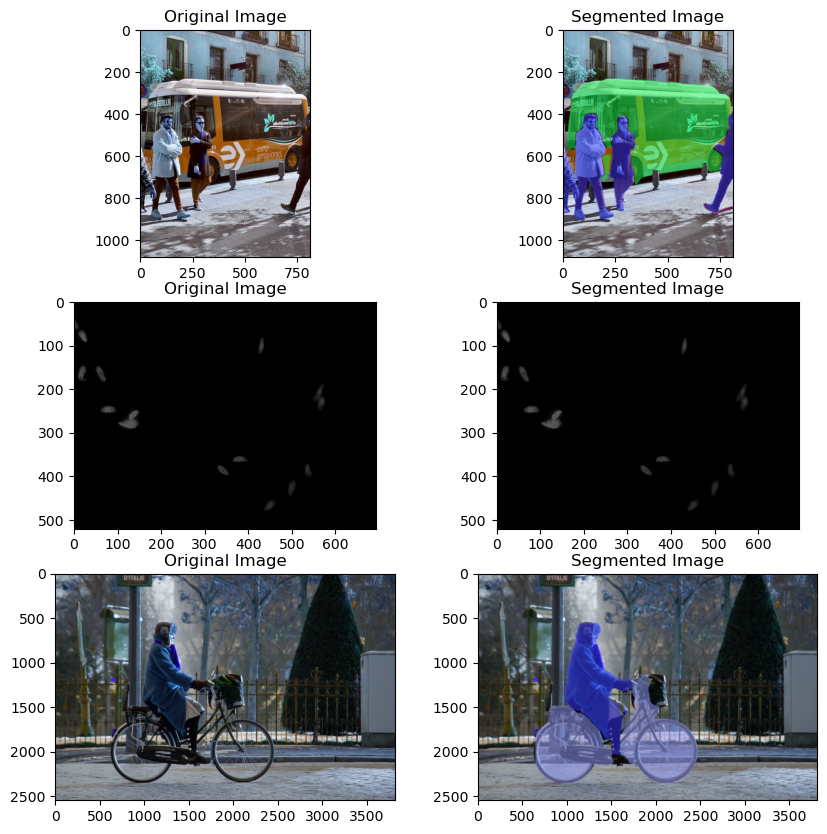

In [44]:
# Plot Results
fig, axes = plt.subplots(3,2,figsize=(10,10))
for i in range(0,3):
    axes[i][0].imshow(eval(f'test_im_{i}'))
    axes[i][0].set_title('Original Image')
    axes[i][1].imshow(cv2.imread(f'runs/segment/predict2/image{i}.jpg'))
    axes[i][1].set_title('Segmented Image')

The YOLO pre-trained model works well on objects like bicycles or persons but not on cells, hence we should train it on our dataset.

## Train On Custom Dataset

In order to train the YOLOv8 model, we need to prepare our dataset in a specific way.

First, we need to have a directory structure as followed:
- ---datasets
-      |
-      |
-     train ----- images
-             |
-             |-- labels
-     val ------- images
-             |
-             |-- labels

In [305]:
def split_train_val_set(img_df, val_split=0.10):
    np.random.seed(42)
    imageIDs = np.sort(img_df['imageId'].values)
    val_set_count = int(len(img_df.index)*val_split)

    val_set_imageIDs = np.random.choice(imageIDs, val_set_count, replace=False)
    train_set_imageIDs = list(set(imageIDs) - set(val_set_imageIDs))
    
    val_set_imageIDs.sort()
    train_set_imageIDs.sort()

    return train_set_imageIDs, val_set_imageIDs

In [306]:
# Train Val Splits
train_ids, val_ids = split_train_val_set(df_image_train)

In [312]:
# Create the labels for each image
# The label should be the x,y coordinates of the contours' points of each nucleus
output_dirs = ['./yolo_dataset/train/labels','./yolo_dataset/val/labels']
ids = [train_ids, val_ids]

for imageIds, output_dir in zip(ids, output_dirs):
    for imageId in imageIds:
        polygons = []
        for mask_ind in df_mask_train[df_mask_train['imageId']==imageId]['mask_path']:

            mask = cv2.imread(mask_ind, cv2.IMREAD_GRAYSCALE)
            _, mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)

            H, W = mask.shape
            contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            # convert the contours to polygons
            for cnt in contours:
                if cv2.contourArea(cnt) > 0: #200:
                    polygon = []
                    for point in cnt:
                        x, y = point[0]
                        polygon.append(x / W)
                        polygon.append(y / H)
                    polygons.append(polygon)

        # print the polygons
        with open('{}.txt'.format(os.path.join(output_dir, imageId)), 'w') as f:
            for polygon in polygons:
                for p_, p in enumerate(polygon):
                    if p_ == len(polygon) - 1:
                        f.write('{}\n'.format(p))
                    elif p_ == 0:
                        f.write('0 {} '.format(p))
                    else:
                        f.write('{} '.format(p))

            f.close()
        
    

In [290]:
#Copy and paste images in appropriate folders
import shutil

for i in train_ids:
    original = df_image_train[df_image_train['imageId']==i]['image_path'].squeeze()
    destination = f"./yolo_dataset/images/train/{i}.{str.split(original,'.')[-1]}"
    shutil.copyfile(original, destination)
    
for i in val_ids:
    original = df_image_train[df_image_train['imageId']==i]['image_path'].squeeze()
    destination = f"./yolo_dataset/images/val/{i}.{str.split(original,'.')[-1]}"
    shutil.copyfile(original, destination)

In [320]:
# Train YOLOv8 model with our dataset
model_yolo.train(data='/Users/theophileloiseau/Documents/Data Science/Projects ML/Bowl_2018/yolo_dataset/config.yaml', 
                 epochs=30,
                imgsz=640, #device="mps"
                )

New https://pypi.org/project/ultralytics/8.0.98 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.96 🚀 Python-3.10.9 torch-2.0.1 CPU
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/Users/theophileloiseau/Documents/Data Science/Projects ML/Bowl_2018/yolo_dataset/config.yaml, epochs=30, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=0, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, cl

       7/30         0G      1.266      1.741     0.7589      1.046        809        640: 100%|██████████| 38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          
                   all         67       2700      0.875      0.756      0.812      0.501      0.858      0.732      0.785      0.426

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size
       8/30         0G      1.257      1.691     0.7498      1.035        710        640: 100%|██████████| 38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          
                   all         67       2700      0.866      0.764      0.812       0.51      0.864      0.727      0.782      0.421

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size
       9/30         0G      1.211      1.648     0.7179      1.016        890        640: 100%|██████████| 38
    

                 Class     Images  Instance
                   all         67       2700      0.898      0.785      0.836      0.569      0.886      0.749      0.803       0.46

30 epochs completed in 17.522 hours.
Optimizer stripped from runs/segment/train9/weights/last.pt, 6.8MB


WARNING ⚠️ ConfusionMatrix plot failure: Invalid format specifier


Optimizer stripped from runs/segment/train9/weights/best.pt, 6.8MB

Validating runs/segment/train9/weights/best.pt...
Ultralytics YOLOv8.0.96 🚀 Python-3.10.9 torch-2.0.1 CPU
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs
                 Class     Images  Instance
                   all         67       2700      0.898      0.779      0.837      0.577      0.889      0.743      0.806      0.469
Speed: 0.9ms preprocess, 181.2ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/segment/train9


WARNING ⚠️ ConfusionMatrix plot failure: Invalid format specifier


In [45]:
# Path to the weights of our best model
model_path = './runs/segment/train9/weights/best.pt'

# Path to one image
image_path = './yolo_dataset/val/images/602f267432e7a573e1092f1cf48135c82d0fbc8722bc028b9330ec801a40bb18.png'
imageid = "602f267432e7a573e1092f1cf48135c82d0fbc8722bc028b9330ec801a40bb18"
image_path_2 = './yolo_dataset/val/images/00ae65c1c6631ae6f2be1a449902976e6eb8483bf6b0740d00530220832c6d3e.png'
imageid_2 = "00ae65c1c6631ae6f2be1a449902976e6eb8483bf6b0740d00530220832c6d3e"

# Read the image
img = cv2.imread(image_path)
img_2 = cv2.imread(image_path_2)

# Get model with weights updated with our dataset
model = YOLO(model_path)

# Get results for our image
results = model(img)
results_2 = model(img_2)

# Format our results into usable masks
res = np.zeros((results[0].masks.data.shape[1], results[0].masks.data.shape[2]))
for idx, i in enumerate(results[0].masks.data):
    res += i.numpy() 
res_2 = np.zeros((results_2[0].masks.data.shape[1], results[0].masks.data.shape[2]))
for idx, i in enumerate(results_2[0].masks.data):
    res_2 += i.numpy() 


0: 480x640 18 nucleuss, 70.5ms
Speed: 1.6ms preprocess, 70.5ms inference, 6.7ms postprocess per image at shape (1, 3, 640, 640)

0: 512x640 86 nucleuss, 86.5ms
Speed: 1.4ms preprocess, 86.5ms inference, 38.9ms postprocess per image at shape (1, 3, 640, 640)


The model has detected **18 nuclei & 86 nuclei** meanwhile previously the original model did not detect anything.

In [46]:
imageid = "602f267432e7a573e1092f1cf48135c82d0fbc8722bc028b9330ec801a40bb18"
imageid_2 = "00ae65c1c6631ae6f2be1a449902976e6eb8483bf6b0740d00530220832c6d3e"

for i in [imageid, imageid_2]:
    height, width = df_image_train[df_image_train['imageId']==i][['height','width']].squeeze()

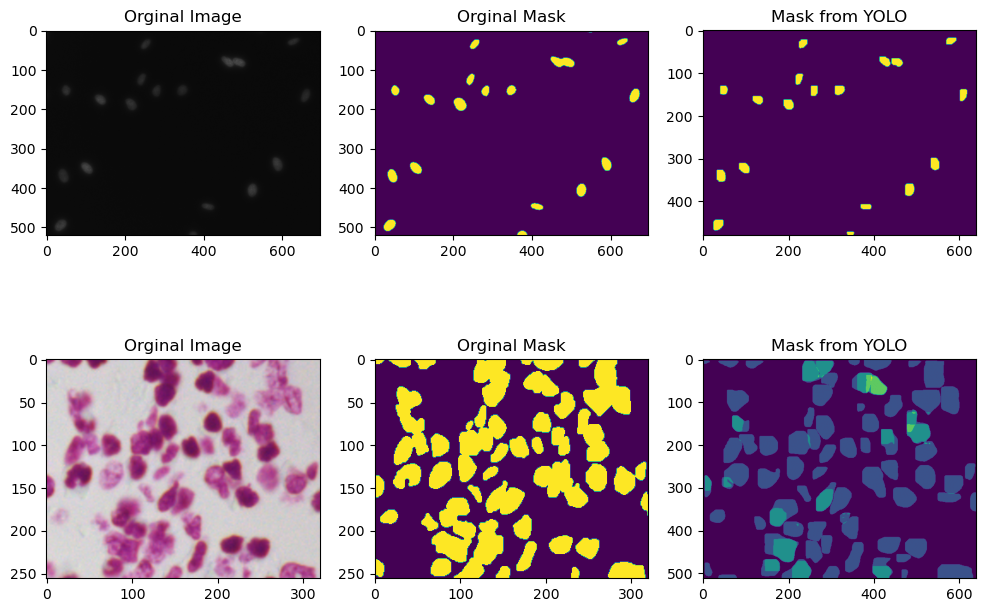

In [48]:
fis, axes = plt.subplots(2,3, figsize=(12,8));
axes[0][0].imshow(img);
axes[0][0].set_title('Orginal Image');
axes[0][1].imshow(read_mask(df_mask_train,imageid));
axes[0][1].set_title('Orginal Mask');
axes[0][2].imshow(res);
axes[0][2].set_title('Mask from YOLO');
axes[1][0].imshow(img_2);
axes[1][0].set_title('Orginal Image');
axes[1][1].imshow(read_mask(df_mask_train,imageid_2));
axes[1][1].set_title('Orginal Mask');
axes[1][2].imshow(res_2);
axes[1][2].set_title('Mask from YOLO');

At first sight, we can see that the results from YOLOv8 is quite satisfying as we haven't done any preprocessing and train only on the first batch of available data. 

The main issue is that some masks are overlapping (which is normal as it is a model for instance segmentation). Hence we need to clean for our task.

In [51]:
res_2_retreated = (res_2 > 0).astype(np.uint8)

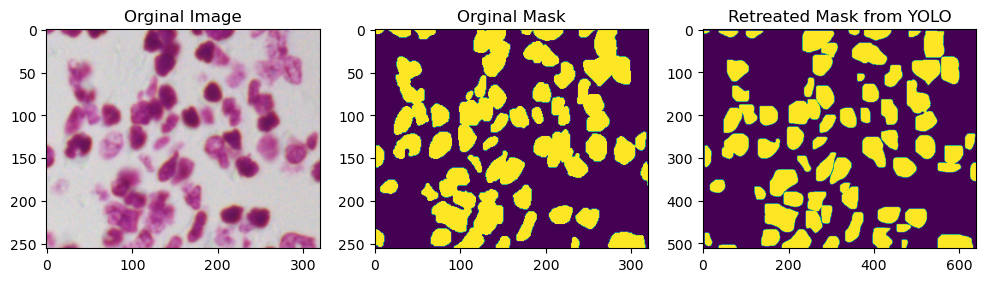

In [52]:
fis, axes = plt.subplots(1,3, figsize=(12,8));
axes[0].imshow(img_2);
axes[0].set_title('Orginal Image');
axes[1].imshow(read_mask(df_mask_train,imageid_2));
axes[1].set_title('Orginal Mask');
axes[2].imshow(res_2_retreated);
axes[2].set_title('Retreated Mask from YOLO');

Now Results are better

## Prediction With Custom YOLO

In [7]:
# Path to the weights of our best model
model_path = './runs/segment/train9/weights/best.pt'

# Get model with weights updated with our dataset
model = YOLO(model_path)

In [8]:
# Make our predictions and save the results in folder
results = model.predict(source=x_stage2, stream=True, imgsz=320)  # generator of Results objects
for idx,r in enumerate(results):
    imageid = df_image_test_stage2['imageId'][idx]
    try:
        masks = r.masks  # Masks object for segment masks outputs
        res = np.zeros((masks.data.shape[1], masks.data.shape[2]))
        for idxx, i in enumerate(masks.data):
            res += i.numpy()
        res = cv2.resize(res, (x_stage2[idx].shape[1], x_stage2[idx].shape[0]), interpolation=cv2.INTER_NEAREST)
    except AttributeError:
        res = np.zeros((x_stage2[idx].shape[0], x_stage2[idx].shape[1]))
    cv2.imwrite(f'./yolo_dataset/outputs/{imageid}.png', res*255.)


0: 320x320 14 nucleuss, 1: 320x320 60 nucleuss, 2: 320x320 20 nucleuss, 3: 320x320 16 nucleuss, 4: 320x320 7 nucleuss, 5: 320x320 33 nucleuss, 6: 320x320 137 nucleuss, 7: 320x320 84 nucleuss, 8: 320x320 (no detections), 9: 320x320 (no detections), 10: 320x320 30 nucleuss, 11: 320x320 13 nucleuss, 12: 320x320 14 nucleuss, 13: 320x320 3 nucleuss, 14: 320x320 27 nucleuss, 15: 320x320 1 nucleus, 16: 320x320 113 nucleuss, 17: 320x320 (no detections), 18: 320x320 51 nucleuss, 19: 320x320 148 nucleuss, 20: 320x320 45 nucleuss, 21: 320x320 135 nucleuss, 22: 320x320 1 nucleus, 23: 320x320 15 nucleuss, 24: 320x320 6 nucleuss, 25: 320x320 44 nucleuss, 26: 320x320 (no detections), 27: 320x320 64 nucleuss, 28: 320x320 (no detections), 29: 320x320 21 nucleuss, 30: 320x320 6 nucleuss, 31: 320x320 (no detections), 32: 320x320 20 nucleuss, 33: 320x320 2 nucleuss, 34: 320x320 24 nucleuss, 35: 320x320 3 nucleuss, 36: 320x320 20 nucleuss, 37: 320x320 115 nucleuss, 38: 320x320 1 nucleus, 39: 320x320 (no d

Speed: 0.6ms preprocess, 47.8ms inference, 5.2ms postprocess per image at shape (1, 3, 320, 320)


In [9]:
# Collect results in dataframe
df_final = pd.DataFrame(columns=['imageId','mask'])
path = './yolo_dataset/outputs'
for idx, filename in enumerate(os.listdir(path)):
    if filename.endswith("png"):
        res_final = []
        res_final.append(filename[0:-4])
        f = os.path.join(path, filename)
        mm = cv2.cvtColor(cv2.imread(f), cv2.COLOR_BGR2GRAY)
        res_final.append(mm)
        df_final.loc[len(df_final)] = res_final

In [16]:
# Merge results to have the same imageId
df_results = df_image_test_stage2.merge(df_final, how='left', on='imageId')

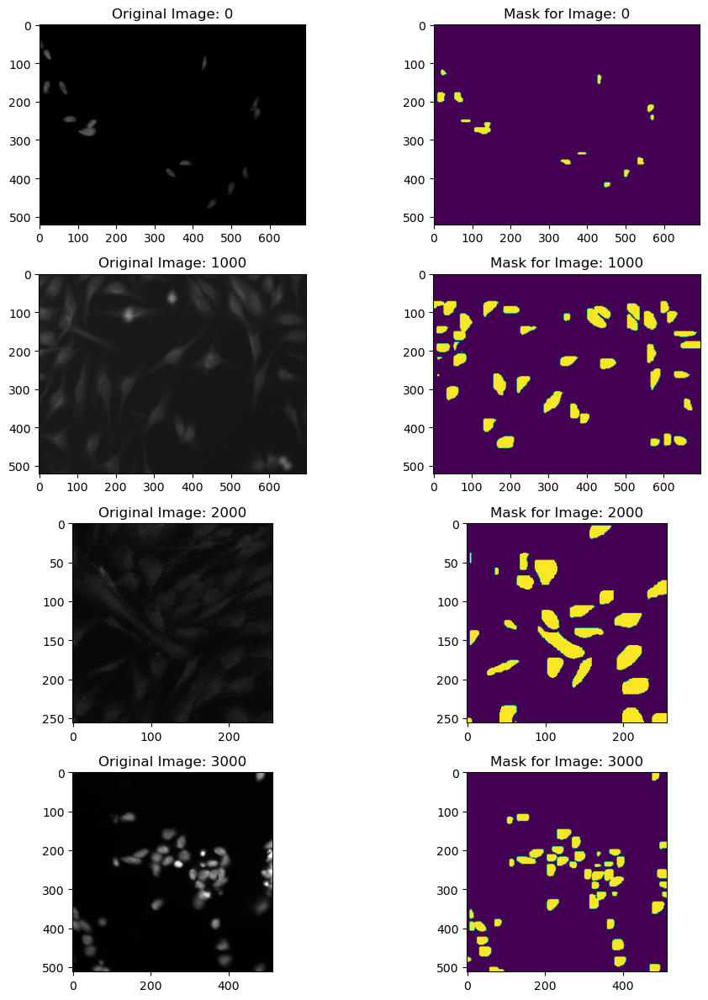

In [33]:
# Plot some results
fig, axes = plt.subplots(4,2, figsize=(10,12))
for idx, i in enumerate([0,1000,2000,3000]):
    axes[idx][0].imshow(cv2.imread(df_results['image_path'][i]))
    axes[idx][0].set_title(f'Original Image: {i}')
    axes[idx][1].imshow(df_results['mask'][i])
    axes[idx][1].set_title(f'Mask for Image: {i}')
plt.tight_layout()

The model detects quite well most of the cells even if the shapes of the nuclei can be improved.
Another drawback that is most likely not linked with the model, is the resizing seems to have compressed images in a smaller area than in reality as we can see for mask # 1000.

In [21]:
# Run-Length Encode 
df_results_yolo = format_output_data_all(df_results, df_results['mask']).sort_values(by='imageId')

# Save Results
df_results_yolo.to_csv('res_yolo.csv',index=False)

Score in Private LeaderBoard: **0.1111**

The results are low, this is most likely due to several points:
- We did not train on the whole available data
- We do not have much data, hence with such a heavy model, we need more data in order to train properly our model. Also the data augmentation made by the model has not been optimized.
- We have not done any preprocessing
- We have not done any post-processing

This part was more about using this use case in order to test YOLOv8

# General Conclusion

We have expored numerous aspects of computer vision in a semantic segmentation tasks. As a non-exhaustive list, we have seen:
- `Data Exploiration` with ratio, type of images, mean colors, etc.
- `Pre-processing` with resizing, put into grayscale, inverse background, sharpen frontiers, normalize data
- `Data Augmentation` and `Test Time Data Augmentation`
- `Post Processing`with opening shapes, watershade, deleting small cells
- Different models with `U-Net` `transfer learning with VGG16` & `YOLO v8`

With all of this, we have obtained a top score of `0.50366` which would have put us at **130th position out of 742** in this contest.

To improve these results, here are some ideas:
- `Increase the number of height and width of the images` (we have done this with lower results which is quite surprising, I believe there is something wrong)
- `Use RGB channels` (we have also done this with lower results which is quite surprising, I believe there is something wrong)
- `Improve watershed process`
- `Have 2 models, one for the black & white images and another one for the colored images.`
- `Have 2+ models, one for the images with a ratio close to 1 and at least another one for the images with much higher or lower ratio.`
- `Better resizing`, there is probably a better way to resize images.
- `Better loss function for the models`, maybe accuracy is not the best loss function.
- `Better architecture for our models`. In particular, dropout rate & activation layer.
- `Better Data Augmentation`, both in quantity and quality.



# Trash

## Watershed 2.0

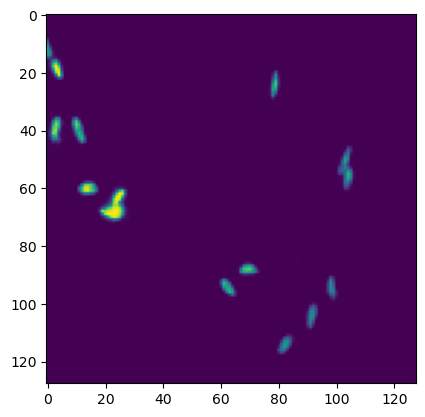

In [272]:
plt.imshow(x_test_stage2_prep_agg[0])

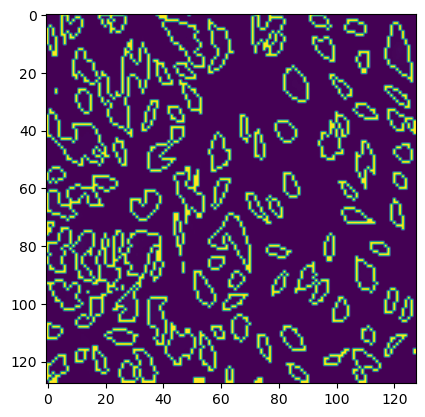

In [270]:
plt.imshow(contour_test)

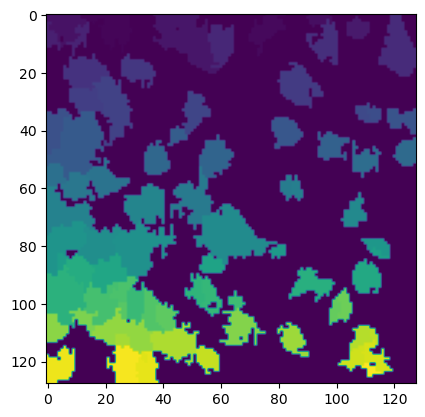

In [269]:
plt.imshow(post_im)

In [175]:
from skimage.segmentation import random_walker

def mark_mask_on_image(mask, image, color=(255,0,0)):
    """ Mark red contours of the given masks on the given image
    """
    mask = mask.astype(np.uint8)*255
    image_color = image.copy()
    if image.ndim is 2:
        image_color = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    
    _,thresh = cv2.threshold(mask,127,255,cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    
    return cv2.drawContours(image_color,contours,-1,color,1)

def post_process_image(image, mask, contour):
    """ Watershed on the markers generated on the sure foreground to find all disconnected objects
    The (mask - contour) is the true foreground. We set the contour to be unknown area. 
    Index of contour = -1
    Index of unkown area = 0
    Index of background = 1  -> set back to 0 after watershed
    Index of found objects > 1
    """
    
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
    
    new_contour = (contour*255).astype(np.uint8)
    new_mask = (mask*255).astype(np.uint8)
    new_mask = cv2.morphologyEx(new_mask, cv2.MORPH_OPEN, kernel, iterations=1)
  

    _, thresh_mask = cv2.threshold(new_mask,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    _, thresh_contour = cv2.threshold(new_contour,0,255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    sure_background = cv2.dilate(thresh_mask,kernel,iterations=3)
    
    sure_foreground = cv2.subtract(thresh_mask, thresh_contour)
    mask_plus_contour = cv2.add(thresh_mask, thresh_contour)
    mask_plus_contour = cv2.cvtColor(mask_plus_contour, cv2.COLOR_GRAY2RGB)

    unknown = cv2.subtract(sure_background, sure_foreground)
    # Marker labelling
    output = cv2.connectedComponentsWithStats(sure_foreground)
    labels = output[1]
    stats = output[2]
    # Add one to all labels so that sure background is not 0, 0 is considered unknown by watershed
    # this way, watershed can distinguish unknown from the background
    labels = labels + 1
    labels[unknown==255] = 0

    try:
        # random walker on thresh_mask leads a lot higher mean IoU but lower LB
        #labels = random_walker(thresh_mask, labels)   
        # random walker on thresh_mask leads lower mean IoU but higher LB
        labels = random_walker(mask_plus_contour, labels, multichannel=True)   

    except:
        labels = cv2.watershed(mask_plus_contour, labels)

    labels[labels==-1] = 0
    labels[labels==1] = 0
    labels = labels -1
    labels[labels==-1] = 0
    # discard nuclei which are too big or too small
    mean = np.mean(stats[1:,cv2.CC_STAT_AREA])

    for i in range(1, labels.max()):
         if stats[i, cv2.CC_STAT_AREA] > mean*10 or stats[i, cv2.CC_STAT_AREA] < mean/10:
            labels[labels==i] = 0
            
    labels = renumber_labels(labels)
        
    return labels

def renumber_labels(label_img):
    """ Re-number nuclei in a labeled image so the nuclei numbers are unique and consecutive.
    """
    new_label = 0
    for old_label in np.unique(label_img):
        if not old_label == new_label:
            label_img[label_img == old_label] = new_label
        new_label += 1

    return label_img


def watershed_transform_all_v2(images, masks):

    preds_test_watershed = []
    for i in range(0, len(images)):
        preds_test_watershed.append(post_process_image(images[i], masks[i], 
                                                       mark_mask_on_image(masks[i], images[i])))
    return np.array(preds_test_watershed)

In [371]:
contour_test = mark_mask_on_image(pred_vgg[6], x_test_stage2_prep_agg[6])
post_im = post_process_image(x_test_stage2_prep_agg[6], pred_vgg[6], contour_test)

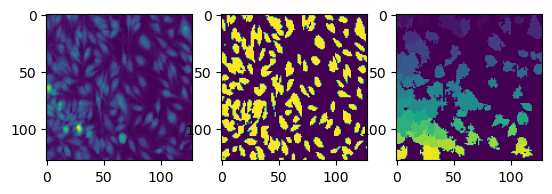

In [372]:
#(2,2)
fig, axes = plt.subplots(1,3);
axes[0].imshow(x_test_stage2_prep_agg[6]);
axes[1].imshow(pred_vgg[6]);
axes[2].imshow(post_im);

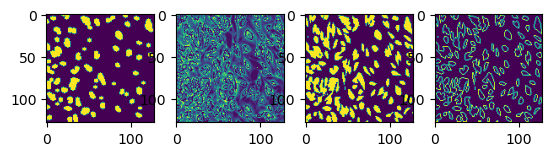

In [228]:
fig, axes = plt.subplots(1,4)
axes[0].imshow(new_mask)
axes[1].imshow(new_contour)
axes[2].imshow(mask)
axes[3].imshow(contour)

In [ ]:
mask_test_stage2_agg_resized_retreated_watershed = watershed_transform_all(preds_test_stage2_agg_resized_retreated, threshold=0.05, kernel_size=(1,1))

df_results_unet_wo_small_watershed = format_output_data_all_masks(df_image_test_stage2, mask_test_stage2_agg_resized_retreated_watershed).sort_values(by='imageId')

df_results_unet_wo_small_watershed.to_csv('res_unet_wo_small_watershed.csv',index=False)

In [336]:
masks_watershed_2 = watershed_transform_all_v2(x_test_stage2_prep_agg, pred_vgg)

masks_watershed_2 = masks_watershed_2.astype(np.float32)

masks_watershed_resized = resize_images(masks_watershed_2, df_image_test_stage2)



In [389]:
type(pred_vgg[0,0,0,0])

numpy.uint8

In [387]:
type(x_test_stage2_prep_agg[0,0,0,0])

numpy.float64

In [399]:
masks_resized = resize_images(pred_vgg, df_image_test_stage2)

images_resized = resize_images(x_test_stage2_prep_agg, df_image_test_stage2)

images_resized = np.array([np.expand_dims(image.astype(np.float32),axis=2) for image in images_resized])

masks_watershed_resized = watershed_transform_all_v2(images_resized, masks_resized)

#masks_watershed_2 = masks_watershed_2.astype(np.float32)



In [400]:
masks_watershed_resized = watershed_transform_all_v2(images_resized, masks_resized)

In [401]:
df_results_watershed = format_output_data_all_masks(df_image_test_stage2, masks_watershed_resized).sort_values(by='imageId')

df_results_watershed.to_csv('res_unet_watershed_2.csv',index=False)

Score in Private LeaderBoard: **0.15953**

## UNet 2.0

In [403]:
def build_model(input_height, input_width, input_channels, output_channels, min_dropout=0.1):
    """Build a simple U-net Keras model.
    Args:
        input_height: The height of all input images.
        input_width: The width of all input images.
        input_channels: The number of input channels.
        output_channels: The number of predicted/output channels.
    Returns:
        A Keras U-net model that can be used for training.
    """
    inputs = Input((input_height, input_width, input_channels))
    s = Lambda(lambda x: x / 255) (inputs)

    c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s)
    c1 = Dropout(min_dropout) (c1)
    c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
    p1 = MaxPooling2D((2, 2)) (c1)

    c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
    c2 = Dropout(min_dropout) (c2)
    c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
    p2 = MaxPooling2D((2, 2)) (c2)

    c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
    c3 = Dropout(min_dropout+0.1) (c3)
    c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
    p3 = MaxPooling2D((2, 2)) (c3)

    c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
    c4 = Dropout(min_dropout+0.1) (c4)
    c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c4)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

    c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p4)
    c5 = Dropout(min_dropout+0.2) (c5)
    c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)

    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u6)
    c6 = Dropout(min_dropout+0.1) (c6)
    c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c6)

    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u7)
    c7 = Dropout(min_dropout+0.1) (c7)
    c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c7)

    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
    c8 = Dropout(min_dropout) (c8)
    c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
    c9 = Dropout(min_dropout) (c9)
    c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

    outputs = Conv2D(output_channels, (1, 1), activation='sigmoid') (c9) 

    model = Model(inputs=[inputs], outputs=[outputs])
    return model


In [406]:
input_height = x_train_prep_agg.shape[1]
input_width = x_train_prep_agg.shape[2]
input_channels = x_train_prep_agg.shape[3]
output_channels = 1
unet_v2 = build_model(input_height, input_width, input_channels, output_channels, min_dropout=0.1)
unet_v2.compile(optimizer='adam', loss='binary_crossentropy', metrics = ['accuracy'])

In [ ]:
# Fit model
earlystopper = EarlyStopping(patience=5, verbose=1)
#checkpointer = ModelCheckpoint('model-dsbowl2018-u_net_128_1_stage1.h5', verbose=1, save_best_only=True)
results = model.fit(x_train_prep_agg, y_train_prep_agg, validation_split=0.1, batch_size=16, epochs=50, 
                    callbacks=[earlystopper, checkpointer])

preds_test_stage2_agg = model.predict(x_test_stage2_prep_agg, verbose=1)

preds_test_stage2_agg = (preds_test_stage2_agg > 0.5).astype(np.uint8)

In [ ]:
preds_test_stage2_agg_resized = resize_images(preds_test_stage2_agg, df_image_test_stage2)

df_results_unet = format_output_data_all(df_image_test_stage2, preds_test_stage2_agg_resized).sort_values(by='imageId')

df_results_unet.to_csv('res_unet.csv',index=False)

# Global Conclusion & Further Improvements

To do:
- increase channels => DONE
- increase h*w => DONE
- utiliser watershed pour splitting cells => DONE
- Data Augmentation => DONE mais de manière cracra
- transfer learning avec VGG (par ex) comme encoder 
- utiliser efficientNet

pour améliorer:
- plus de data augmentation et plus optimisé
- amélioration du watershed (faire un watershed pour detecter les centres mais ensuite attribuer à chaque pixels le bon
- prendre une plus grande résolution (voir si on fait pas de conneries)

To do:
- increase channels => DONE
- increase h*w => DONE
- utiliser watershed pour splitting cells => DONE
- Data Augmentation => DONE mais de manière cracra
- transfer learning avec VGG (par ex) comme encoder 
- utiliser efficientNet

pour améliorer:
- plus de data augmentation et plus optimisé
- amélioration du watershed (faire un watershed pour detecter les centres mais ensuite attribuer à chaque pixels le bon
- prendre une plus grande résolution (voir si on fait pas de conneries)

# Trash

To do:
- Explication du problème + explication des différents fichiers
- Data Exploration
    - cb d'images dans nos datasets
    - image size
    - Image formats
    - Timestamps (création + modification)
    - Exif metadata (voir si on a ça avec png)
    - Distribution du nombre de nuclei par image
    - Taille des nuclei
    - Cb d'images dans le train et test sets
    - voir s'il y a un lien entre la date et les différents KPIs
- Travail sur les inputs
    - ajouter l'info sur les timestamps, metadata si nécessaire
    - faire en sorte d'avoir des images de même taille => padding?
    - changer les couleurs
    - faire de la data augmentation
        - adding noise
        - cropping
        - flipping
        - rotation
        - scaled
        - translation
        - brigthness (utile dans notre cas?)
        - contrast (utile dans notre cas?)
        - saturation (utile dans notre cas?)
        - color augmentation (utile dans notre cas?)
        - shear
- utilisation de modèle
    - KNN
    - UNet
    

In [ ]:
im_with_keypoints = cv2.drawKeypoints(im, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


In [ ]:
im_with_keypoints = cv2.drawKeypoints(im, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


In [ ]:
im_with_keypoints.shape

In [ ]:
fig, axes = plt.subplots(1,figsize=(6,6))

axes.imshow(im_with_keypoints);

In [ ]:
fig, axes = plt.subplots(1,figsize=(6,6))

axes.imshow(im);

In [ ]:
img

In [ ]:
df_image_train['image_path'][i]

In [23]:
img = cv2.imread(df_image_train['image_path'][i])

In [25]:
params = cv2.SimpleBlobDetector_Params()
params.filterByArea = False
params.filterByInertia = False
params.filterByConvexity = False

# detect the blobs
detector = cv2.SimpleBlobDetector_create(params)
keypoints = detector.detect(img)

# display them
img_with_keypoints = cv2.drawKeypoints(img, keypoints, outImage=np.array([]), color=(0, 0, 255),flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


In [31]:
cv2.imshow("Frame", img_with_keypoints)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [28]:
params = cv2.SimpleBlobDetector_Params()
params.maxArea = 100000
params.minInertiaRatio = 0.05
params.minConvexity = .60
detector = cv2.SimpleBlobDetector_create(params)

In [29]:
keypoints = detector.detect(img)

# display them
img_with_keypoints = cv2.drawKeypoints(img, keypoints, outImage=np.array([]), color=(0, 0, 255),flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


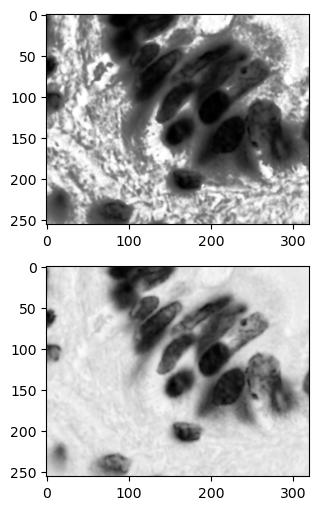

In [591]:
fig, axes = plt.subplots(2,figsize=(6,6))
img3 = cv2.imread(df_image_train['image_path'][9])
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
dst = cv2.equalizeHist(img3)

axes[0].imshow(dst, cmap='gray');
axes[1].imshow(img3, cmap='gray');

In [ ]:
axes[1].imshow(img3, cmap='gray');axes[1].imshow(img3, cmap='gray');